<a href="https://colab.research.google.com/github/egorssed/Galaxy_modelling_VAE/blob/main/Results_study.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
import numpy as np
import pandas as pd
import copy
import matplotlib.pyplot as plt
import matplotlib as mpl
import keras.backend as K
import tensorflow as tf
from tensorflow.python.ops import math_ops
from google.colab import drive
drive.mount('/content/drive')
Folder='/content/drive/My Drive/TP4b/'

import sys
import os
sys.path.append(Folder+'/Modules')

#Utility modules
import Variational_autoencoder as VAE
import VAE_analysis as Analysis
import Image_Fits_Stats
import Visual_analysis
import Dataset_overview_filtering as overview

VAE.image_size=64
VAE.batch_size = 32
VAE.latent_dim = 64
VAE.start_lr = 1e-6

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Prepare the data

In [2]:
from sklearn.model_selection import train_test_split


#We normalize the data to [0,1]

#Read the images and the features from the google drive
galaxy_images=np.load(Folder+'Data/Radial_cut=0.05/Images_MAD_Filtered.npy')
df=pd.read_csv(Folder+'Data/Radial_cut=0.05/Labels_MAD_Filtered.csv',index_col=0)


#Leave the number of images multiple of the batch_size
Size_of_dataset=len(galaxy_images[:-(len(galaxy_images)%VAE.batch_size)])
Number_of_batches=Size_of_dataset//VAE.batch_size
df=df.iloc[:Size_of_dataset]
galaxy_images=galaxy_images[:Size_of_dataset]

#Bring images to a proper tensorial form
gal_dataset_images=np.reshape(VAE.normalize_image(copy.deepcopy(galaxy_images)), 
                              (len(galaxy_images), galaxy_images.shape[1], galaxy_images.shape[2], 1)).astype('float32')
df['Noise_sigma']/=df['max_I']
#Separate the features we are eager to predict in the latent space
Features=['max_I','Noise_sigma']

#Extract test dataset
x_train,x_test,y_train,y_test= train_test_split(gal_dataset_images, df[Features].astype('float32'), test_size=round(0.05*Number_of_batches)*VAE.batch_size,random_state=42)
#Extract train and validation datasets
x_train, x_val , y_train, y_val= train_test_split(x_train, y_train, test_size=round(0.05*Number_of_batches)*VAE.batch_size,random_state=42)
#All the sets have number of galaxies which is a multiple of the batch size (32)
#The random_state is fixed so the split is reproducible yet random

Label the images such that we can pass additional information to the reconstruction loss functions

In [3]:
Features_number=len(Features)
Features_means=df[Features].mean(axis=0)
Features_stds=df[Features].std(axis=0)

def make_labeled_images(x,labels):
  res=np.zeros((len(x),x.shape[1]+1,x.shape[2],1))
  res[:,:-1,:,:]=x
  res[:,-1,:Features_number,0]=labels
  return res.astype('float32')

x_train_labeled=make_labeled_images(x_train,y_train)
x_test_labeled=make_labeled_images(x_test,y_test)
x_val_labeled=make_labeled_images(x_val,y_val)
galaxies_labeled=make_labeled_images(gal_dataset_images,df[Features])

In [4]:
#Data to estimate model's quality

COSMOS_indices_to_compare=np.zeros(8,dtype=int)
COSMOS_indices_to_compare=[33671, 25576, 45805, 31577, 41707, 19844, 13628,  8624]
images_to_compare_indices=df[np.isin(df.COSMOS_index,COSMOS_indices_to_compare)].index
imgs=np.zeros((32,64,64,1))
imgs[:8] = gal_dataset_images[images_to_compare_indices]
labels_to_compare=np.ones((32,2))
labels_to_compare[:8]=df.iloc[images_to_compare_indices][['max_I','Noise_sigma']]
n_compare = 8

# Load intermediate model

In [ ]:
beta_vae=1e-2
activation='softplus'
loss_type='mse'

models,model_loss_function,reconstruction_loss_function,regularization_loss_function=\
  VAE.get_VAE(activation,loss_type,beta_vae=beta_vae)

Checkpoint_to_load=130
Checkpoint_name='Models/MAE+Softplus/beta_vae=1e-2/'
Checkpoints_Folder=Folder+Checkpoint_name

models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

#z_means=models['z_meaner'].predict(gal_dataset_images)
#z_log_vars=models['z_log_varer'].predict(gal_dataset_images)
#decoded=models['vae'].predict(gal_dataset_images)
#std_of_mu=z_means.std(axis=0)
#mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
#ratio=std_of_mu/mean_of_var

# Reconstruction loss

## Galaxy for gradients estimation

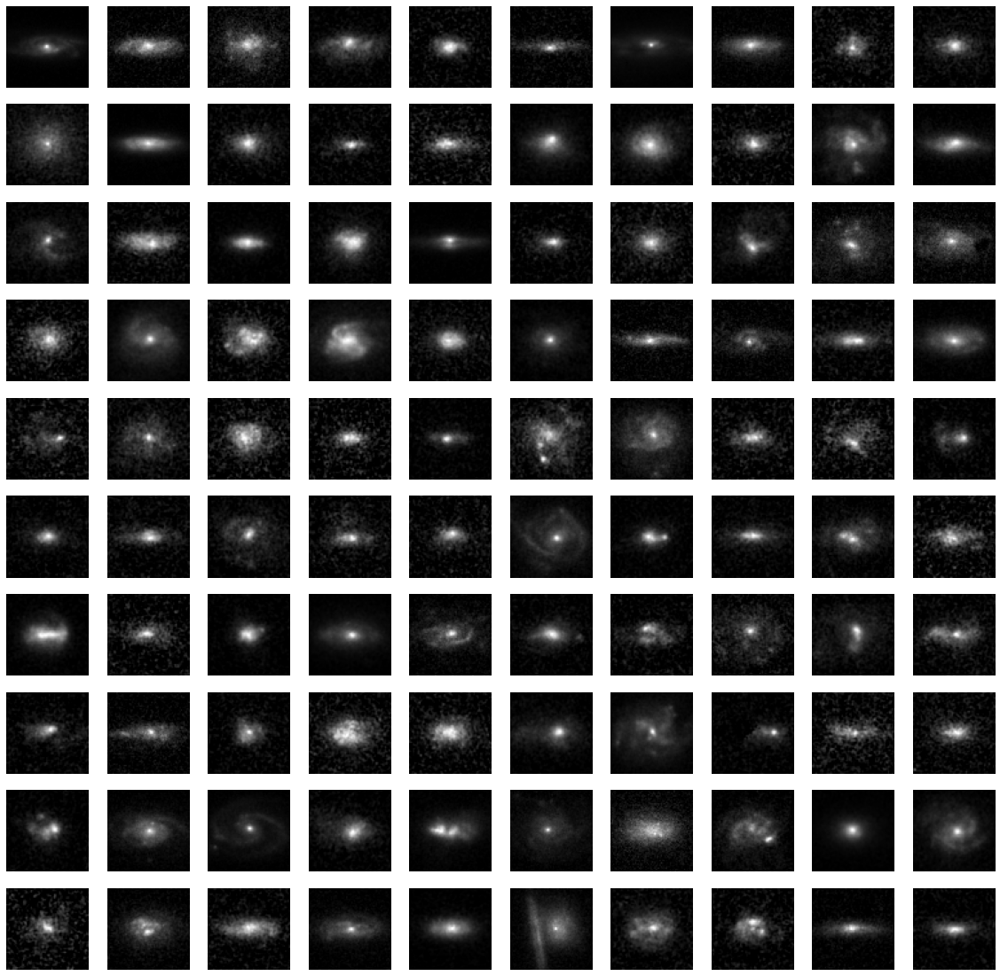

In [ ]:
overview.Show_100(x_test[:,:,:,0],y_test.reset_index().iloc[300:],cmap='gray')

In [ ]:
#grad_estim_galaxy=x_test[382:414]
#grad_estim_galaxy_pred=models['vae'].predict(grad_estim_galaxy)
#grad_estim_labels=y_test[382:414]

In [ ]:
grad_estim_galaxy=imgs
grad_estim_galaxy_pred=models['vae'].predict(grad_estim_galaxy).astype('double')
grad_estim_labels=labels_to_compare

## Gradients

In [ ]:
def MAE_from_Deconv(y,Deconv,labels=None):
  x=K.softplus(Deconv)
  return K.sum(K.abs(y-x),axis=[1,2,3])

def MSE_from_Deconv(y,Deconv,labels=None):
  x=K.softplus(Deconv)
  return K.sum(K.square(y-x),axis=-1)



def BCE_from_logits(y,logit,labels=None):
  x=tf.sigmoid(logit)
  return K.sum(K.binary_crossentropy(y,x),axis=-1)

def SSIM_loss(y,x,labels=None):
  return 1-tf.image.ssim(y,x,max_val=1,filter_size=8)

def SSIM_from_Deconv(y,Deconv,labels=None):
  x=K.softplus(Deconv)
  return 1-tf.image.ssim(y,x,max_val=1,filter_size=8)


power_factors=np.array([0.0448, 0.2856, 0.3001, 0.2363])
power_factors/=power_factors.sum()

def MS_SSIM_loss(y,x,labels=None):
  return 1-tf.image.ssim_multiscale(y,x,max_val=1,filter_size=8,power_factors=power_factors)


def MS_SSIM_from_Deconv(y,Deconv,labels=None):
  x=K.softplus(Deconv)
  return 1-tf.image.ssim_multiscale(y,x,max_val=1,filter_size=8,power_factors=power_factors)

def chi_sq_from_Deconv(y_true,Deconv,labels):
      #Set the true values for Chi squared
      Amplitude_true=labels[:,0]
      Gaussian_noise=labels[:,1]

      y_true = tf.convert_to_tensor(y_true)
      y_pred = tf.convert_to_tensor(tf.sigmoid(Deconv))

      #(data-model)^2
      reconstruction_loss=K.square(y_true-y_pred)

      #Calculate Poisson and Gaussian noise
      #COSMOS dataset exposure time is 2028 sec
      Poisson_noise_variance=tf.abs(y_true/2028)
      Gaussian_noise_scaled=VAE.get_matrix_shape(Gaussian_noise,y_true)
      Gaussian_noise_variance=tf.math.pow(Gaussian_noise_scaled,2)

      #Calculate weights=1/noise_variance
      noise_variance=Poisson_noise_variance+Gaussian_noise_variance
      weights=tf.math.pow(noise_variance,-1)
      weights= math_ops.cast(weights, y_pred.dtype)

      #chi_sq=(data-model)^2*weights
      chi_sq=reconstruction_loss*weights
      #Reduce last dimension to return images (N,64,64)
      return K.sum(chi_sq,axis=-1)

In [ ]:
grad_estim_galaxy_pred[grad_estim_galaxy_pred>0.999]=0.999
grad_estim_galaxy_pred[grad_estim_galaxy_pred<0.001]=0.001
logit_grad_estim_galaxy_pred=np.log(grad_estim_galaxy_pred/(1-grad_estim_galaxy_pred))
logSoft_grad_estim_galaxy_pred=np.log(np.exp(grad_estim_galaxy_pred)-1)

In [ ]:
BCE_logit_grads=Analysis.calculate_gradient(grad_estim_galaxy,logit_grad_estim_galaxy_pred,BCE_from_logits)

#SSIM_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,SSIM_loss)
SSIM_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,SSIM_from_Deconv)

#MS_SSIM_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,MS_SSIM_loss)
MS_SSIM_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,MS_SSIM_from_Deconv)

#MAE_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,VAE.get_reconstruction_loss('mae'))
MAE_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,MAE_from_Deconv)

#MSE_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,VAE.get_reconstruction_loss('mse'))
MSE_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,MSE_from_Deconv)

#alpha=0.5
#combined_grads=alpha*SSIM_grads+(1-alpha)*MAE_grads*gauss_kernel(sig=8.)
chi_sq_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,chi_sq_from_Deconv,labels=grad_estim_labels)

### Fine-tune loss

In [ ]:
def norm(tensor):
    image=tensor[1,:,:,0]
    image[image>0]/=image.max()
    image[image<0]/=np.abs(image.min())
    return image

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.


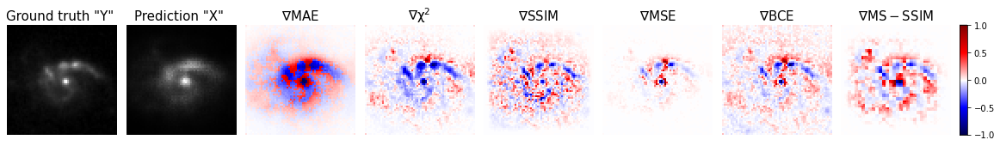

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid

im_titles=['Ground truth "Y" ','Prediction "X" ',r'$\mathrm{\nabla MAE}$',\
           r'$\mathrm{\nabla \chi^2}$',\
           r'$\mathrm{\nabla SSIM}$',\
           r'$\mathrm{\nabla MSE}$',\
           r'$\mathrm{\nabla BCE}$',\
           r'$\mathrm{\nabla MS-SSIM}$']

# Set up figure and image grid
fig = plt.figure(figsize=(20,20))

ax = ImageGrid(fig, 111,          # as in plt.subplot(111)
                 nrows_ncols=(1,8),
                 axes_pad=0.15,
                 share_all=True,
                 cbar_location="right",
                 cbar_mode="single",
                 cbar_size="7%",
                 cbar_pad=0.15,
                 )


ax[0].imshow(norm(grad_estim_galaxy),cmap='gray')
ax[1].imshow(norm(grad_estim_galaxy_pred),cmap='gray')
im=ax[2].imshow(norm(MAE_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))
ax[3].imshow(norm(chi_sq_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))
ax[4].imshow(norm(SSIM_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))
ax[5].imshow(norm(MSE_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))
ax[6].imshow(norm(BCE_logit_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))
ax[7].imshow(norm(MS_SSIM_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))


for i in range(8):
  ax[i].set_title(im_titles[i],fontsize=15)
  ax[i].axis('off')

# Colorbar
ax[-1].cax.colorbar(im,ticks=[-1,-0.5,0,0.5,1])
ax[-1].cax.toggle_label(True)

#plt.tight_layout()    # Works, but may still require rect paramater to keep colorbar labels visible
plt.show()

### MS-SSIM

In [ ]:
def gauss_kernel(l=64, sig=8.):
    """\
    creates gaussian kernel with side length l and a sigma of sig
    """

    ax = tf.linspace(-(l - 1) / 2., (l - 1) / 2., l)
    xx, yy = tf.meshgrid(ax, ax)

    kernel = tf.math.exp(-0.5 * (tf.square(xx) + tf.square(yy)) / tf.square(sig))

    return kernel / K.sum(kernel)

In [ ]:
BCE_logit_grads=Analysis.calculate_gradient(grad_estim_galaxy,logit_grad_estim_galaxy_pred,BCE_from_logits)

#SSIM_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,SSIM_loss)
SSIM_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,SSIM_from_Deconv)

#MS_SSIM_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,MS_SSIM_loss)
MS_SSIM_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,MS_SSIM_from_Deconv)

#MAE_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,VAE.get_reconstruction_loss('mae'))
MAE_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,MAE_from_Deconv)

#MSE_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,VAE.get_reconstruction_loss('mse'))
MSE_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,MSE_from_Deconv)

alpha=0.5
combined_grads=alpha*SSIM_grads+(1-alpha)*MAE_grads*gauss_kernel(sig=8.)
#chi_sq_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,VAE.get_reconstruction_loss('chi_sq'),labels=grad_estim_labels)

In [ ]:
K.sum(Gaussian_kernel)

<tf.Tensor: shape=(), dtype=float32, numpy=1.0>

In [ ]:
(SSIM_grads)[1].max()

0.0027230062647420365

In [ ]:
K.eval(MAE_grads*gauss_kernel(sig=8.)).max()

0.0015408461

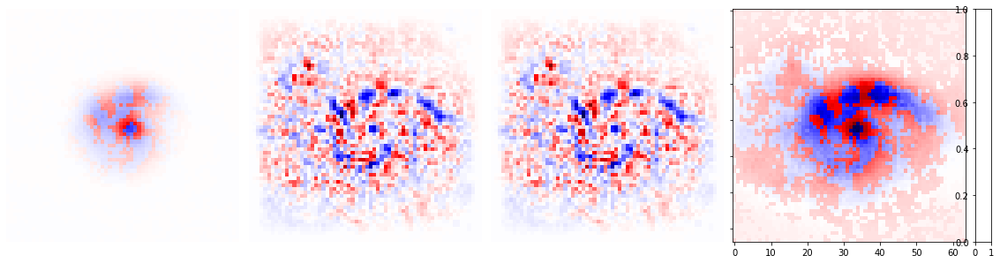

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid

im_titles=['Ground truth "Y" ','Prediction "X" ',r'$\mathrm{\partial MAE \slash \partial L}$',r'$\mathrm{\partial MSE \slash \partial L}$',\
           r'$\mathrm{\partial BCE \slash \partial L}$',\
           r'$\mathrm{\partial SSIM \slash \partial L}$',\
           r'$\mathrm{\partial MS\_SSIM \slash \partial L}$']

# Set up figure and image grid
fig = plt.figure(figsize=(20,20))

ax = ImageGrid(fig, 111,          # as in plt.subplot(111)
                 nrows_ncols=(1,4),
                 axes_pad=0.15,
                 share_all=True,
                 cbar_location="right",
                 cbar_mode="single",
                 cbar_size="7%",
                 cbar_pad=0.15,
                 )

vmin=combined_grads[1,:,:,0].min()
vmax=combined_grads[1,:,:,0].max()
norm=mpl.colors.TwoSlopeNorm(0,vmin,vmax)
ax[0].imshow((1-alpha)*MAE_grads[1,:,:,0]*gauss_kernel(sig=8),cmap='seismic',norm=norm)
ax[1].imshow(combined_grads[1,:,:,0],cmap='seismic',norm=norm)
ax[2].imshow(alpha*SSIM_grads[1,:,:,0],cmap='seismic',norm=norm)
ax[3].imshow(MAE_grads[1,:,:,0],cmap='seismic')

for i in range(3):
  #ax[i].set_title(im_titles[i],fontsize=15)
  ax[i].axis('off')


#plt.tight_layout()    # Works, but may still require rect paramater to keep colorbar labels visible
plt.show()

### other options

In [ ]:
def norm(tensor):
    image=tensor[1,:,:,0]
    image[image>0]/=image.max()
    image[image<0]/=np.abs(image.min())
    return image

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.


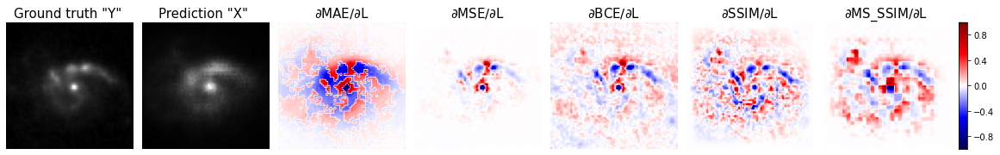

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid

im_titles=['Ground truth "Y" ','Prediction "X" ',r'$\mathrm{\partial MAE \slash \partial L}$',r'$\mathrm{\partial MSE \slash \partial L}$',\
           r'$\mathrm{\partial BCE \slash \partial L}$',\
           r'$\mathrm{\partial SSIM \slash \partial L}$',\
           r'$\mathrm{\partial MS\_SSIM \slash \partial L}$']

# Set up figure and image grid
fig = plt.figure(figsize=(20,20))

ax = ImageGrid(fig, 111,          # as in plt.subplot(111)
                 nrows_ncols=(1,7),
                 axes_pad=0.15,
                 share_all=True,
                 cbar_location="right",
                 cbar_mode="single",
                 cbar_size="7%",
                 cbar_pad=0.15,
                 )


ax[0].imshow(norm(grad_estim_galaxy),cmap='gray')
ax[1].imshow(norm(grad_estim_galaxy_pred),cmap='gray')
im=ax[2].imshow(norm(MAE_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))
ax[3].imshow(norm(MSE_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))
ax[4].imshow(norm(BCE_logit_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))
ax[5].imshow(norm(SSIM_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))
ax[6].imshow(norm(MS_SSIM_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))

for i in range(7):
  ax[i].set_title(im_titles[i],fontsize=15)
  ax[i].axis('off')

# Colorbar
ax[-1].cax.colorbar(im)
ax[-1].cax.toggle_label(True)

#plt.tight_layout()    # Works, but may still require rect paramater to keep colorbar labels visible
plt.show()

In [ ]:
grad_estim_galaxy=x_test[382:414]
grad_estim_galaxy_pred=models['vae'].predict(grad_estim_galaxy)
grad_estim_labels=y_test[382:414]

grad_estim_galaxy_pred[grad_estim_galaxy_pred>0.999]=0.999
grad_estim_galaxy_pred[grad_estim_galaxy_pred<0.001]=0.001
logit_grad_estim_galaxy_pred=np.log(grad_estim_galaxy_pred/(1-grad_estim_galaxy_pred))
logSoft_grad_estim_galaxy_pred=np.log(np.exp(grad_estim_galaxy_pred)-1)

In [ ]:
BCE_logit_grads=Analysis.calculate_gradient(grad_estim_galaxy,logit_grad_estim_galaxy_pred,BCE_from_logits)

#SSIM_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,SSIM_loss)
SSIM_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,SSIM_from_Deconv)

#MS_SSIM_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,MS_SSIM_loss)
MS_SSIM_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,MS_SSIM_from_Deconv)

#MAE_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,VAE.get_reconstruction_loss('mae'))
MAE_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,MAE_from_Deconv)

#MSE_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,VAE.get_reconstruction_loss('mse'))
MSE_grads=Analysis.calculate_gradient(grad_estim_galaxy,logSoft_grad_estim_galaxy_pred,MSE_from_Deconv)


#chi_sq_grads=Analysis.calculate_gradient(grad_estim_galaxy,grad_estim_galaxy_pred,VAE.get_reconstruction_loss('chi_sq'),labels=grad_estim_labels)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.


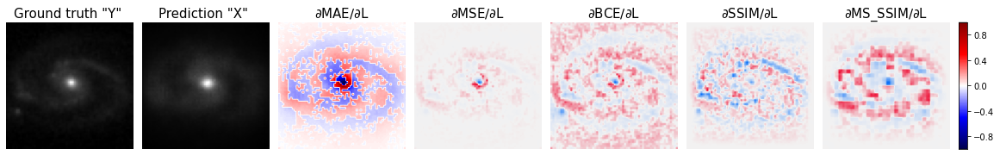

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid

im_titles=['Ground truth "Y" ','Prediction "X" ',r'$\mathrm{\partial MAE \slash \partial L}$',r'$\mathrm{\partial MSE \slash \partial L}$',\
           r'$\mathrm{\partial BCE \slash \partial L}$',\
           r'$\mathrm{\partial SSIM \slash \partial L}$',\
           r'$\mathrm{\partial MS\_SSIM \slash \partial L}$']

# Set up figure and image grid
fig = plt.figure(figsize=(20,20))

ax = ImageGrid(fig, 111,          # as in plt.subplot(111)
                 nrows_ncols=(1,7),
                 axes_pad=0.15,
                 share_all=True,
                 cbar_location="right",
                 cbar_mode="single",
                 cbar_size="7%",
                 cbar_pad=0.15,
                 )


ax[0].imshow(norm(grad_estim_galaxy),cmap='gray')
ax[1].imshow(norm(grad_estim_galaxy_pred),cmap='gray')
im=ax[2].imshow(norm(MAE_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))
ax[3].imshow(norm(MSE_grads),cmap=cmap,norm=mpl.colors.TwoSlopeNorm(0))
ax[4].imshow(norm(BCE_logit_grads),cmap=cmap,norm=mpl.colors.TwoSlopeNorm(0))
ax[5].imshow(norm(SSIM_grads),cmap=cmap,norm=mpl.colors.TwoSlopeNorm(0))
ax[6].imshow(norm(MS_SSIM_grads),cmap=cmap,norm=mpl.colors.TwoSlopeNorm(0))

for i in range(7):
  ax[i].set_title(im_titles[i],fontsize=15)
  ax[i].axis('off')

# Colorbar
ax[-1].cax.colorbar(im)
ax[-1].cax.toggle_label(True)

#plt.tight_layout()    # Works, but may still require rect paramater to keep colorbar labels visible
plt.show()

In [ ]:
q=gauss_kernel()

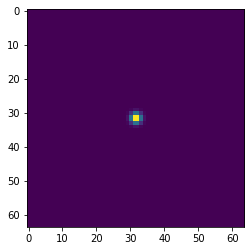

In [ ]:
plt.imshow(q)

Maximal brightness 1.0


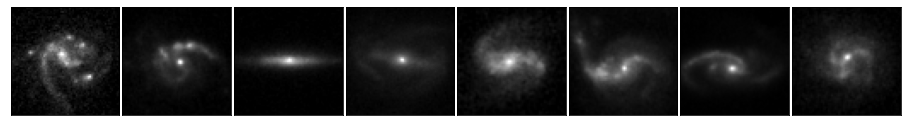

In [ ]:
Analysis.plot_galaxies(imgs[:8])

In [ ]:
norm(MSE_grads).max()

0.28460865068032853

In [ ]:
norm(MSE_grads).min()

-1.0

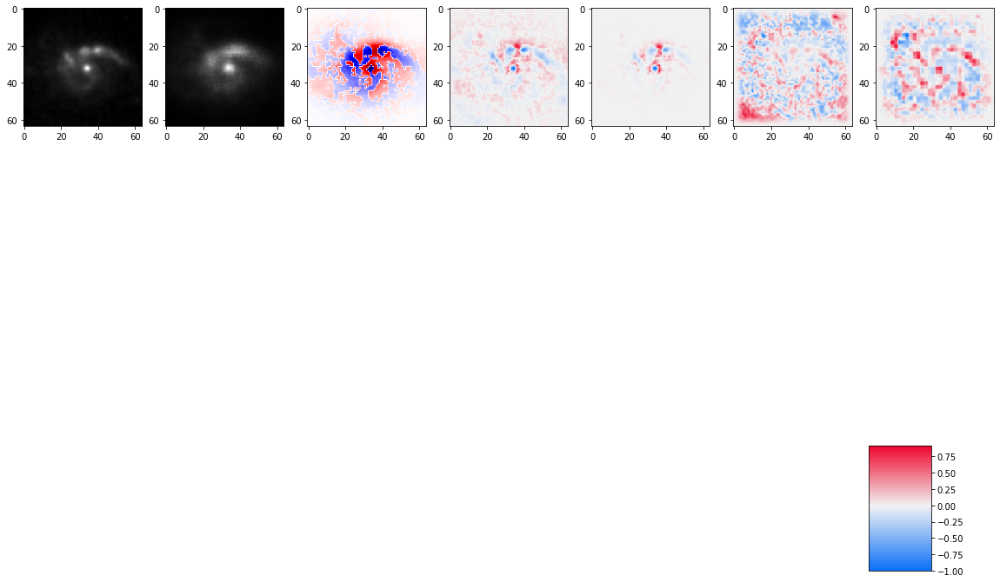

In [ ]:
f, ax = plt.subplots(1, 7,figsize=(20,20))

ax[0].imshow(norm(grad_estim_galaxy),cmap='gray')
ax[1].imshow(norm(grad_estim_galaxy_pred),cmap='gray')
ax[2].imshow(norm(MAE_grads),cmap='seismic',norm=mpl.colors.TwoSlopeNorm(0))
ax[3].imshow(norm(BCE_logit_grads),cmap=cmap,norm=mpl.colors.TwoSlopeNorm(0))
ax[4].imshow(norm(MSE_grads),cmap=cmap,norm=mpl.colors.TwoSlopeNorm(0))
ax[5].imshow(norm(SSIM_grads),cmap=cmap,norm=mpl.colors.TwoSlopeNorm(0))
im=ax[6].imshow(norm(MS_SSIM_grads),cmap=cmap,norm=mpl.colors.TwoSlopeNorm(0))

#f.subplots_adjust()
cbar_ax = f.add_axes([0.8, 0.1, 0.05, 0.1])
f.colorbar(im, cax=cbar_ax)

plt.show()

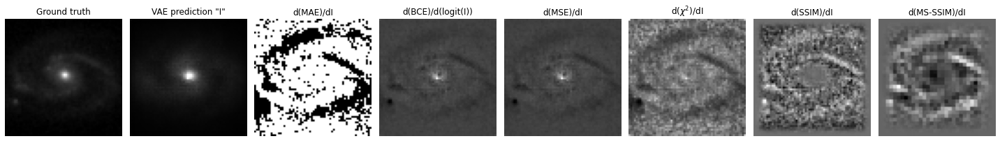

In [ ]:
#grad_estim_galaxy=x_test[210]

f, ax = plt.subplots(1, 8, sharey=True,figsize=(20,20))
im_titles=['Ground truth','VAE prediction "I"','d(MAE)/dI','d(BCE)/d(logit(I))','d(MSE)/dI',r'd($\chi^2$)/dI','d(SSIM)/dI','d(MS-SSIM)/dI']
ax[0].imshow(norm(grad_estim_galaxy),cmap='gray')
ax[1].imshow(norm(grad_estim_galaxy_pred),cmap='gray')
ax[2].imshow((MAE_grads[0,:,:,0]+1)/2,cmap='gray')
ax[3].imshow(norm(BCE_logit_grads),cmap='gray')
ax[4].imshow(norm(MSE_grads),cmap='gray')
ax[5].imshow(norm(chi_sq_grads),cmap='gray')
ax[6].imshow(norm(SSIM_grads),cmap='gray')
im=ax[7].imshow(norm(MS_SSIM_grads),cmap='gray')


for i in range(8):
  ax[i].set_title(im_titles[i])
  ax[i].axis('off')
plt.tight_layout()

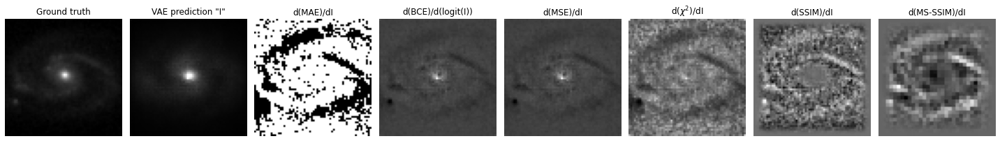

In [ ]:
#grad_estim_galaxy=x_test[290]

f, ax = plt.subplots(1, 8, sharey=True,figsize=(20,20))
im_titles=['Ground truth','VAE prediction "I"','d(MAE)/dI','d(BCE)/d(logit(I))','d(MSE)/dI',r'd($\chi^2$)/dI','d(SSIM)/dI','d(MS-SSIM)/dI']
ax[0].imshow(norm(grad_estim_galaxy),cmap='gray')
ax[1].imshow(norm(grad_estim_galaxy_pred),cmap='gray')
ax[2].imshow((MAE_grads[0,:,:,0]+1)/2,cmap='gray')
ax[3].imshow(norm(BCE_logit_grads),cmap='gray')
ax[4].imshow(norm(MSE_grads),cmap='gray')
ax[5].imshow(norm(chi_sq_grads),cmap='gray')
ax[6].imshow(norm(SSIM_grads),cmap='gray')
im=ax[7].imshow(norm(MS_SSIM_grads),cmap='gray')


for i in range(8):
  ax[i].set_title(im_titles[i])
  ax[i].axis('off')
plt.tight_layout()

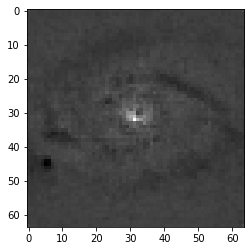

In [ ]:
plt.imshow(BCE_logit_grads[0,:,:,0],cmap='gray')

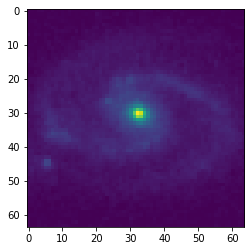

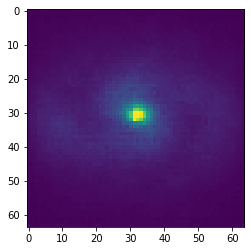

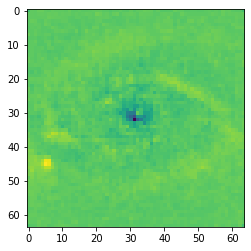

In [ ]:
plt.imshow(grad_estim_galaxy[0,:,:,0])
plt.show()
plt.imshow(grad_estim_galaxy_pred[0,:,:,0])
plt.show()
plt.imshow(grad_estim_galaxy[0,:,:,0]-grad_estim_galaxy_pred[0,:,:,0])
plt.show()


## Comparison of different losses results

In [ ]:
models_BCE,_,_,_=VAE.get_VAE('sigmoid','binary_crossentropy',beta_vae=1e-2)
models_BCE['vae'].load_weights('/content/drive/My Drive/Lensed Source modelling research/'\
                                  +'Models/MAD_estimated_noise/BCE_Sigmoid_beta=1e-2_new_DS/'+'epoch_{}/Model'.format(197))
'''
models_chi_sq,_,_,_=VAE.get_VAE('softplus','chi_sq',beta_vae=1e-2)
models_chi_sq['vae'].load_weights('/content/drive/My Drive/Lensed Source modelling research/'\
                                  +'Models/MAD_estimated_noise/Chisq_beta=1e-4_new_DS/'+'epoch_{}/Model'.format(131))'''

models_chi_sq,_,_,_=VAE.get_VAE('softplus','chi_sq',beta_vae=1e-2)
models_chi_sq['vae'].load_weights('/content/drive/My Drive/Lensed Source modelling research/'\
                                  +'Models/MAD_estimated_noise/Correct_chi_sq/Chisq_lowered_700_chisq_SNR=30_beta=1e-3_new_DS/'+'epoch_{}/Model'.format(70))


models_mae,_,_,_=VAE.get_VAE('softplus','mae',beta_vae=1e-2)
models_mae['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/MAE+Softplus/beta_vae=1e-2/'+'epoch_{}/Model'.format(130))

models_mae_SSIM_FT,_,_,_=VAE.get_VAE('softplus','SSIM',beta_vae=1e-2)
models_mae_SSIM_FT['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/Pretrain_MAE_beta=1e-2_epoch_130/SSIM_beta=0.5*1e-4/'+'epoch_{}/Model'.format(70))


models_mae_MSSSIM_FT,_,_,_=VAE.get_VAE('softplus','SSIM',beta_vae=1e-2)
models_mae_MSSSIM_FT['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/Pretrain_MAE_beta=1e-2_epoch_130/0.5_MAE_SSIM_beta=0.5*1e-4/'+'epoch_{}/Model'.format(80))


models_mae_MSE_FT,_,_,_=VAE.get_VAE('softplus','SSIM',beta_vae=1e-2)
models_mae_MSE_FT['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/Pretrain_MAE_beta=1e-2_epoch_130/3*MSE_beta=1e-2/'+'epoch_{}/Model'.format(80))

mse_loss=VAE.get_reconstruction_loss('mse')

### statistics

In [ ]:
def get_reconstruction_stats(models,full_dataset=True):
    if full_dataset:
      target=gal_dataset_images
    else:
      target=x_test
    
    decoded=K.eval(models['decoder'].predict(models['z_meaner'].predict(target)))
    maxima=K.eval(decoded).max(axis=(1,2,3))
    maxima_RAE=np.abs(maxima-1)

    MSE_loss=K.eval(K.mean(K.square(target-decoded),axis=[1,2,3]))
    #MSE_loss=np.sort(MSE_loss)[:int(len(MSE_loss)*0.99)]

    SSIM=tf.image.ssim(target.astype('double'), decoded.astype('double'),max_val=1,filter_size=8).numpy()

    return np.median(MSE_loss),np.mean(MSE_loss),np.std(MSE_loss),np.median(SSIM),np.median(maxima_RAE)

In [ ]:
Reconst_quality=np.zeros((5,6))

Reconst_quality[:,0]=get_reconstruction_stats(models_BCE,False)
Reconst_quality[:,1]=get_reconstruction_stats(models_chi_sq,False)
Reconst_quality[:,2]=get_reconstruction_stats(models_mae,False)
Reconst_quality[:,3]=get_reconstruction_stats(models_mae_SSIM_FT,False)
Reconst_quality[:,4]=get_reconstruction_stats(models_mae_MSSSIM_FT,False)
Reconst_quality[:,5]=get_reconstruction_stats(models_mae_MSE_FT,False)



Reconst_quality=pd.DataFrame(Reconst_quality[:,::-1],index=['MSE median','MSE mean','MSE std','SSIM median','RAE median'],columns=['BCE','Chi_sq','MAE','MAE_SSIM','MAE_MS-SSIM','MAE_MSE'][::-1])
Reconst_quality

,MAE_MSE,MAE_MS-SSIM,MAE_SSIM,MAE,Chi_sq,BCE
MSE median,0.000982,0.001023,0.001141,0.001053,0.001030,0.001131
MSE mean,0.001259,0.001312,0.001480,0.001353,0.001304,0.001409
MSE std,0.000973,0.001019,0.001173,0.001060,0.000995,0.001023
SSIM median,0.627492,0.636430,0.632129,0.606078,0.628599,0.619902
RAE median,0.056226,0.055325,0.039743,0.069306,0.087987,0.146554


In [ ]:
Reconst_quality*100

,MAE_MSE,MAE_MS-SSIM,MAE_SSIM,MAE,Chi_sq,BCE
MSE median,0.098248,0.102274,0.114061,0.105341,0.102964,0.113115
MSE mean,0.125914,0.131150,0.147967,0.135334,0.130395,0.140922
MSE std,0.097262,0.101942,0.117273,0.106045,0.099522,0.102252
SSIM median,62.749016,63.642979,63.212812,60.607815,62.859946,61.990362
RAE median,5.622584,5.532530,3.974283,6.930581,8.798736,14.655453


### Visual comparison

In [ ]:
def get_reconstruction(models,images):
  return K.eval(models['decoder'].predict(models['z_meaner'].predict(imgs)))

In [ ]:
imgs_BCE_Sigm=get_reconstruction(models_BCE,imgs)
imgs_chi_sq=get_reconstruction(models_chi_sq,imgs)
imgs_mae=get_reconstruction(models_mae,imgs)
imgs_mae_SSIM=get_reconstruction(models_mae_SSIM_FT,imgs)
imgs_mae_MS_SSIM=get_reconstruction(models_mae_MSSSIM_FT,imgs)
imgs_mae_MSE=get_reconstruction(models_mae_MSE_FT,imgs)

Maximal brightness 1.0


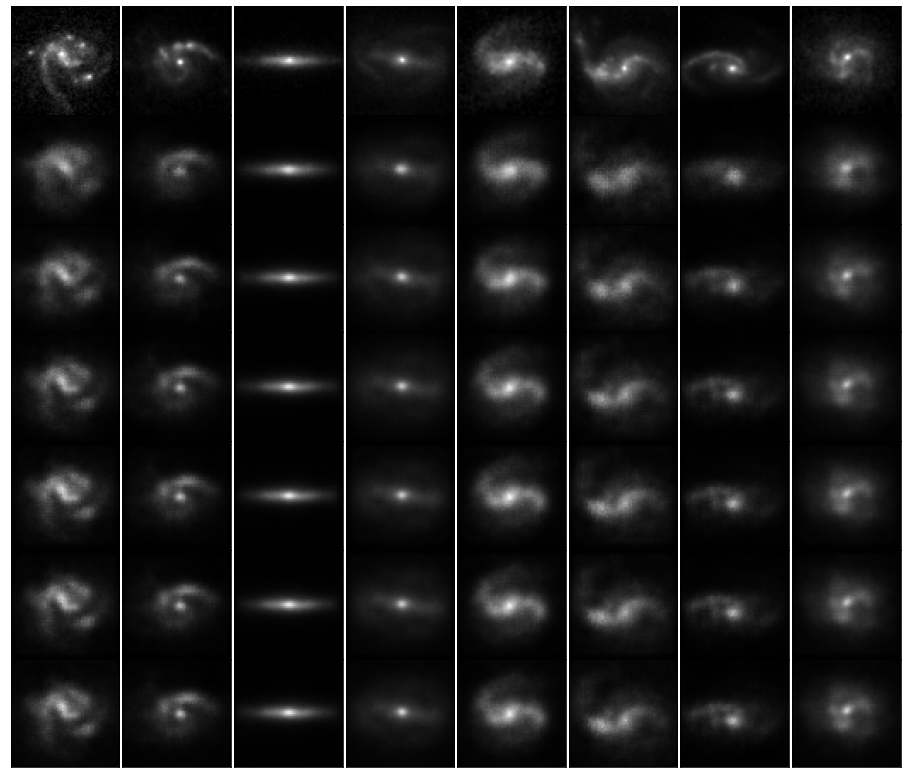

In [ ]:
Analysis.plot_galaxies(imgs[:8],imgs_BCE_Sigm[:8],imgs_chi_sq[:8],imgs_mae[:8],imgs_mae_SSIM[:8],imgs_mae_MS_SSIM[:8],imgs_mae_MSE[:8])

In [ ]:
comparison_array=np.zeros((7,64,64,1))
comparison_labels=np.ones((7,2))*labels_to_compare[4]

index=0
comparison_array[0]=imgs[index]
comparison_array[1]=imgs_BCE_Sigm[index]
comparison_array[2]=imgs_chi_sq[index]
comparison_array[3]=imgs_mae[index]
comparison_array[4]=imgs_mae_SSIM[index]
comparison_array[5]=imgs_mae_MS_SSIM[index]
comparison_array[6]=imgs_mae_MSE[index]

Maximal brightness 1.0


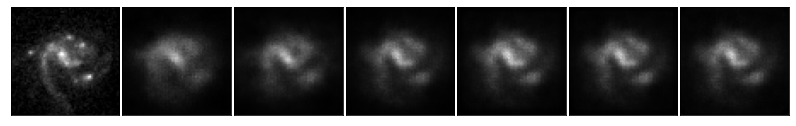

[861901.28707372 473813.56795379 448964.01247927 471225.85852965
 513660.74667752 500126.71212568 502921.22748661]
[ 0.         31.60484403 28.04987516 26.37033277 26.87421233 24.9197017
 24.61319444]


In [ ]:
Analysis.plot_galaxies(comparison_array)

mse_loss=VAE.get_reconstruction_loss('mse')
chi_sq_loss=VAE.get_reconstruction_loss('chi_sq')
comparison_chi_sq=K.eval(chi_sq_loss((np.ones((7,64,64,1))*imgs[4]),comparison_array,comparison_labels))
comparison_mse=K.eval(mse_loss((np.ones((7,64,64,1))*imgs[index]),comparison_array,comparison_labels))

print(comparison_chi_sq.mean(axis=-1).mean(axis=-1)*1e+4)
print(comparison_mse.mean(axis=-1).mean(axis=-1)*1e+4)

In [ ]:
comparison_mse.mean(axis=-1).mean(axis=-1)

array([0.        , 0.00316048, 0.00280499, 0.00263703, 0.00268742,
       0.00249197, 0.00246132])

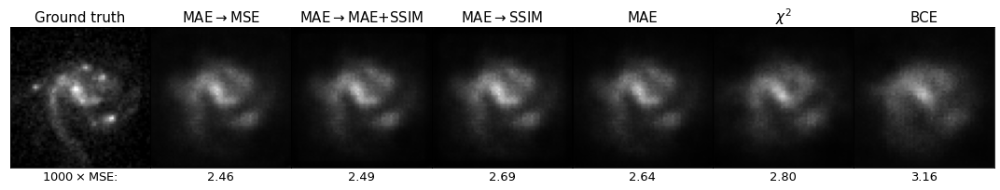

In [ ]:
f, ax = plt.subplots(1, 7, figsize=(15,10))

#Original images

fig_titles=['BCE',r'$\chi^2$','MAE','MAE'+r'$\rightarrow$'+'SSIM','MAE'+r'$\rightarrow$'+'MAE+SSIM','MAE'+r'$\rightarrow$'+'MSE']
array_to_plot=comparison_array.copy()
array_to_plot[1:]=array_to_plot[1:][::-1]

for i in range(7):
  ax[i].imshow(array_to_plot[i,:,:,0],cmap='gray',vmin=0,vmax=1)
  ax[i].set_xticks([])
  ax[i].set_yticks([])
  if i==0:
    ax[i].set_xlabel(r'$1000 \times $'+'MSE:',fontsize=13)
    ax[i].set_title('Ground truth',fontsize=15)
  if i>0:
    #ax[i].text(34, 62,'Loss={:.1f}'.format(comparison_mse.mean(axis=-1).mean(axis=-1)[i]*1e+4), color='red',size=10,weight="bold")
    ax[i].set_xlabel('{:.2f}'.format(comparison_mse.mean(axis=-1).mean(axis=-1)[::-1][i-1]*1e+3),fontsize=13)
    ax[i].set_title(fig_titles[::-1][i-1],fontsize=15)



plt.tight_layout(w_pad=-1.9)
#plt.savefig('Networks_comparison.png')
plt.show()

In [ ]:
fig_titles[::-1]

['MAE$\\rightarrow$MSE',
 'MAE$\\rightarrow$MAE+SSIM',
 'MAE$\\rightarrow$SSIM',
 'MAE',
 '$\\chi^2$',
 'BCE']

In [ ]:
beta_vae=1e-2
activation='softplus'
loss_type='mse'

models_BCE,model_loss_function,reconstruction_loss_function,regularization_loss_function=\
  VAE.get_VAE(activation,loss_type,beta_vae=beta_vae)

Checkpoint_to_load=80
Checkpoint_name='Models/Pretrain_MAE_beta=1e-2_epoch_130/3*MSE_beta=1e-2/'
Checkpoints_Folder=Folder+Checkpoint_name

models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

# Regularization loss

## Constant pressure

In [ ]:
models_BCE,_,_,_=VAE.get_VAE('sigmoid','binary_crossentropy',beta_vae=1e-2)
models_BCE['vae'].load_weights('/content/drive/My Drive/Lensed Source modelling research/'\
                                  +'Models/MAD_estimated_noise/BCE_Sigmoid_beta=1e-2_new_DS/'+'epoch_{}/Model'.format(197))
'''
models_chi_sq,_,_,_=VAE.get_VAE('softplus','chi_sq',beta_vae=1e-2)
models_chi_sq['vae'].load_weights('/content/drive/My Drive/Lensed Source modelling research/'\
                                  +'Models/MAD_estimated_noise/Chisq_beta=1e-4_new_DS/'+'epoch_{}/Model'.format(131))'''

models_chi_sq,_,_,_=VAE.get_VAE('softplus','chi_sq',beta_vae=1e-2)
models_chi_sq['vae'].load_weights('/content/drive/My Drive/Lensed Source modelling research/'\
                                  +'Models/MAD_estimated_noise/Correct_chi_sq/Chisq_lowered_700_chisq_SNR=30_beta=1e-3_new_DS/'+'epoch_{}/Model'.format(70))


models_mae,_,_,_=VAE.get_VAE('softplus','mae',beta_vae=1e-2)
models_mae['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/MAE+Softplus/beta_vae=1e-2/'+'epoch_{}/Model'.format(130))

models_mae_SSIM_FT,_,_,_=VAE.get_VAE('softplus','SSIM',beta_vae=1e-2)
models_mae_SSIM_FT['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/Pretrain_MAE_beta=1e-2_epoch_130/SSIM_beta=0.5*1e-4/'+'epoch_{}/Model'.format(70))


models_mae_MSSSIM_FT,_,_,_=VAE.get_VAE('softplus','SSIM',beta_vae=1e-2)
models_mae_MSSSIM_FT['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/Pretrain_MAE_beta=1e-2_epoch_130/0.5_MAE_SSIM_beta=0.5*1e-4/'+'epoch_{}/Model'.format(80))


models_mae_MSE_FT,_,_,_=VAE.get_VAE('softplus','SSIM',beta_vae=1e-2)
models_mae_MSE_FT['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/Pretrain_MAE_beta=1e-2_epoch_130/3*MSE_beta=1e-2/'+'epoch_{}/Model'.format(80))

models_Old_BCE,_,_,_=VAE.get_VAE('sigmoid','mae',beta_vae=1e-2)
models_Old_BCE['vae'].load_weights('/content/drive/My Drive/Lensed Source modelling research/'\
                                  +'Models/Sigmoid_BCE/'+'epoch_{}/Model'.format(320))


models_Old_chi_sq,_,_,_=VAE.get_VAE('softplus','mae',beta_vae=1e-2)
models_Old_chi_sq['vae'].load_weights('/content/drive/My Drive/Lensed Source modelling research/'\
                                  +'Models/Softplus_chisq_Poisson_beta=0.001/'+'epoch_{}/Model'.format(320))


mse_loss=VAE.get_reconstruction_loss('mse')

In [ ]:
def assess_latent_impact(models,z_means,SNR,number_of_z_to_consider=8):
    latent_average=z_means.mean(axis=0)
    #Latent variables sorted in decresaing SNR
    variables_to_consider=np.argsort(SNR)[::-1][:number_of_z_to_consider]
    variances_to_consider=z_means.std(axis=0)[variables_to_consider]
    #Sample mean+3*sigma and mean-3*sigma
    z_max=np.zeros((number_of_z_to_consider+1,64))
    z_min=np.zeros((number_of_z_to_consider+1,64))

    #i - number of variable to change
    for i in range(number_of_z_to_consider+1):
      #Vary the latent variables if i!=0
      z_max[i,:]=latent_average
      z_min[i,:]=latent_average
      if i!=0:
        z_max[i,variables_to_consider[i-1]]+=3*variances_to_consider[i-1]
        z_min[i,variables_to_consider[i-1]]-=3*variances_to_consider[i-1]
      
    #Decode latent space
    Max_variance_images=models['decoder'].predict(z_max)
    Min_variance_images=models['decoder'].predict(z_min)

    print("Maximal variance")
    Analysis.plot_galaxies(Max_variance_images,dimensions='2d')
    Analysis.plot_galaxies(Max_variance_images,dimensions='3d')
    
    print("Minimal variance")
    Analysis.plot_galaxies(Min_variance_images,dimensions='2d')
    Analysis.plot_galaxies(Min_variance_images,dimensions='3d')

def predict_latent_space(models,images):
    z_means=models['z_meaner'].predict(images)
    z_log_vars=models['z_log_varer'].predict(images)
    std_of_mu=z_means.std(axis=0)
    mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
    SNR=std_of_mu/mean_of_var
    return z_means,z_log_vars,SNR

models trained on big galaxies

### BCE

In [ ]:
z_means,z_log_vars,SNR=predict_latent_space(models_BCE,gal_dataset_images)

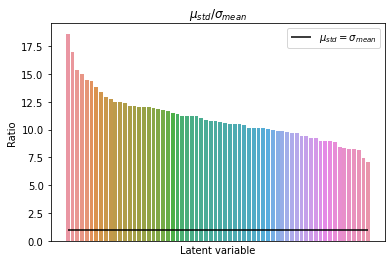

Maximal variance
Maximal brightness 0.8940112


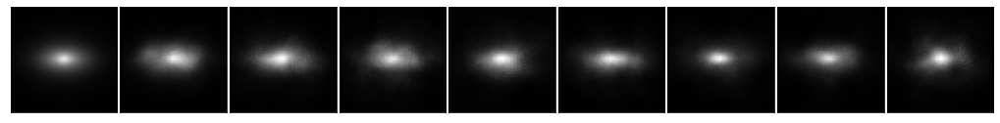

Maximal brightness 0.8940112


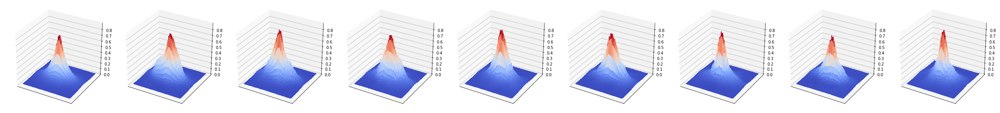

Minimal variance
Maximal brightness 0.8249721


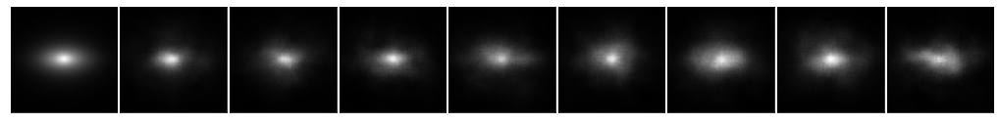

Maximal brightness 0.8249721


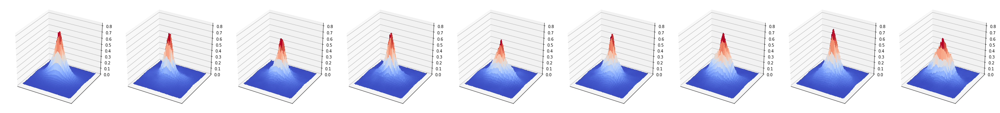

In [ ]:
Analysis.latent_relation_of_variances(SNR,sorted=True)
assess_latent_impact(models_BCE,z_means,SNR,number_of_z_to_consider=8)

Maximal brightness 0.84024996


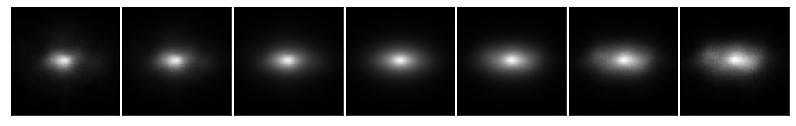

Maximal brightness 0.88364315


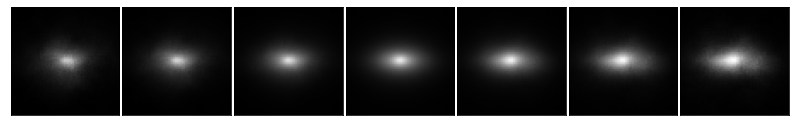

Maximal brightness 0.8125118


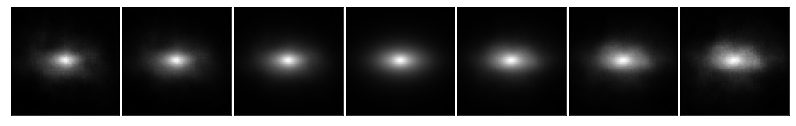

Maximal brightness 0.8940114


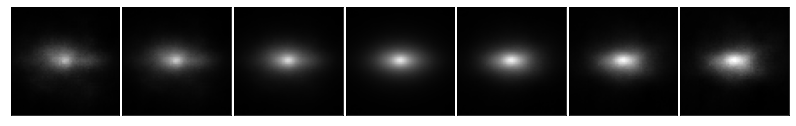

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_BCE,z_means,number_of_z_to_consider=4,sort_array=SNR)

Maximal brightness 0.84024996


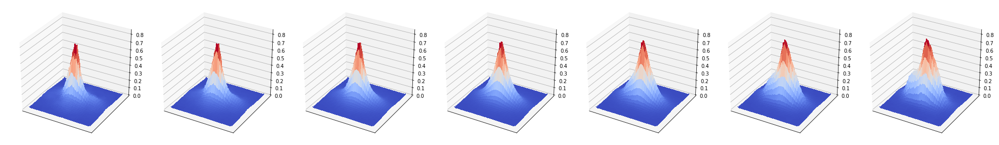

Maximal brightness 0.88364315


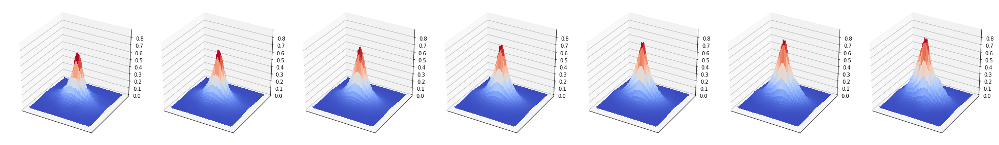

Maximal brightness 0.8125118


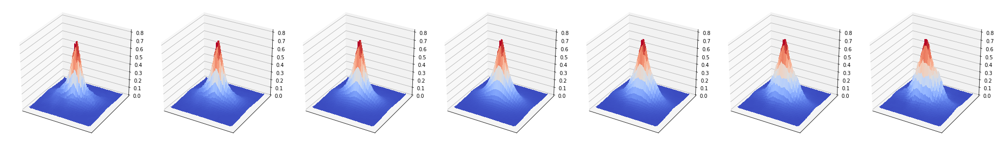

Maximal brightness 0.8940114


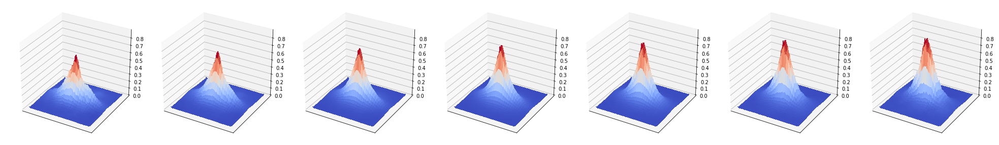

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_BCE,z_means,number_of_z_to_consider=4,sort_array=SNR,dimensions='3d')

### chi_sq

In [ ]:
z_means,z_log_vars,SNR=predict_latent_space(models_chi_sq,gal_dataset_images)

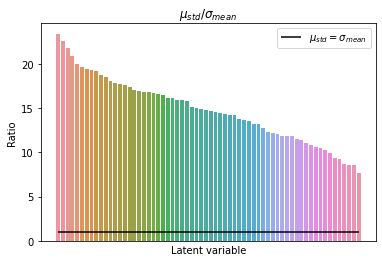

Maximal variance
Maximal brightness 0.92587554


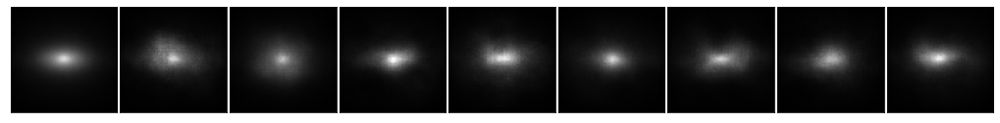

Maximal brightness 0.92587554


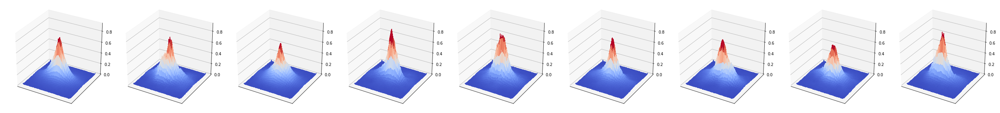

Minimal variance
Maximal brightness 0.92372376


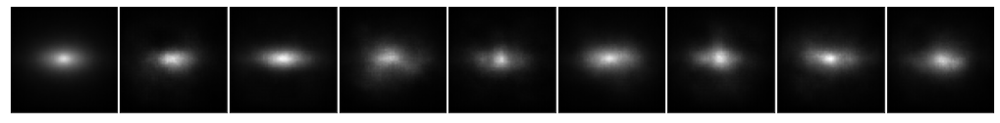

Maximal brightness 0.92372376


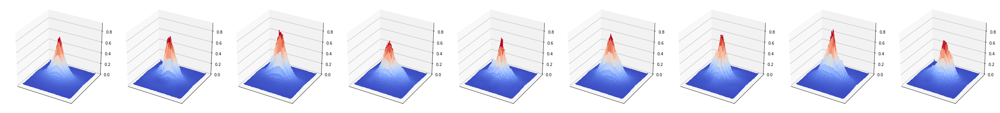

In [ ]:
Analysis.latent_relation_of_variances(SNR,sorted=True)
assess_latent_impact(models_chi_sq,z_means,SNR,number_of_z_to_consider=8)

Maximal brightness 0.8080802


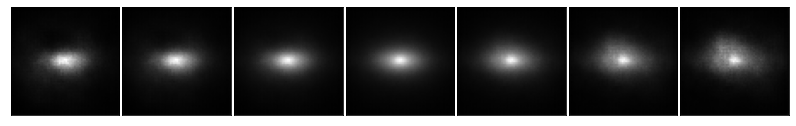

Maximal brightness 0.9073771


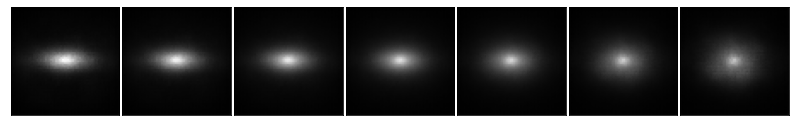

Maximal brightness 0.9258752


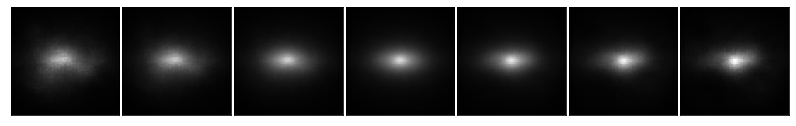

Maximal brightness 0.8766822


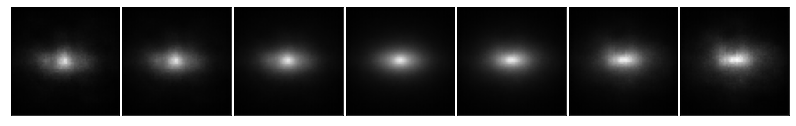

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_chi_sq,z_means,number_of_z_to_consider=4,dimensions='2d',sort_array=SNR)

Maximal brightness 0.80808026


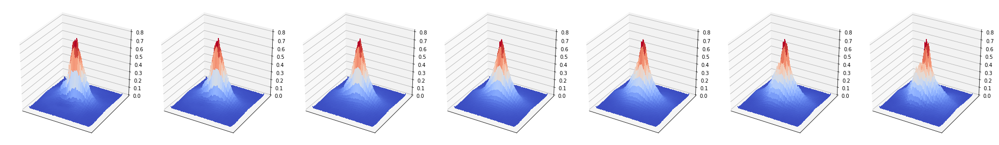

Maximal brightness 0.9073771


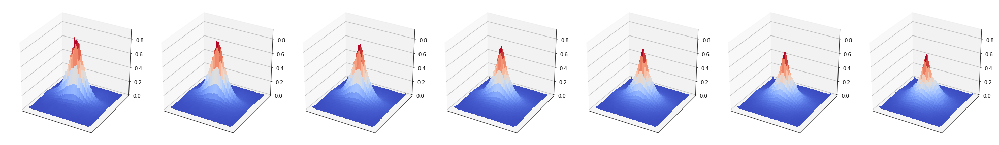

Maximal brightness 0.9258751


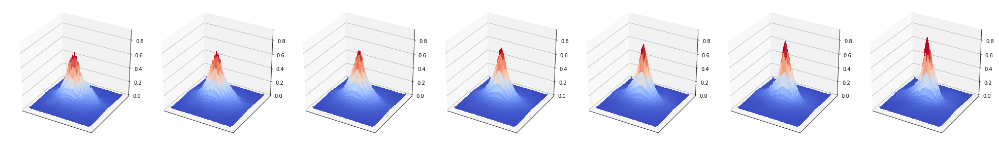

Maximal brightness 0.8766822


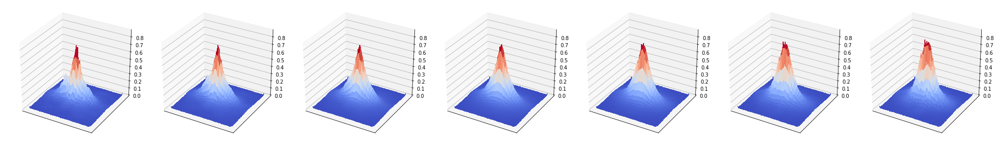

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_chi_sq,z_means,number_of_z_to_consider=4,dimensions='3d',sort_array=SNR)

### MAE

In [ ]:
z_means,z_log_vars,SNR=predict_latent_space(models_mae,gal_dataset_images)

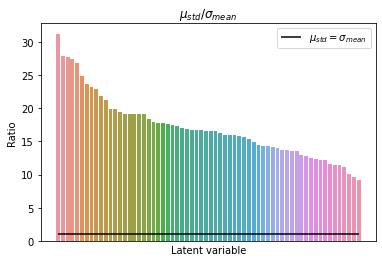

Maximal variance
Maximal brightness 1.0147823


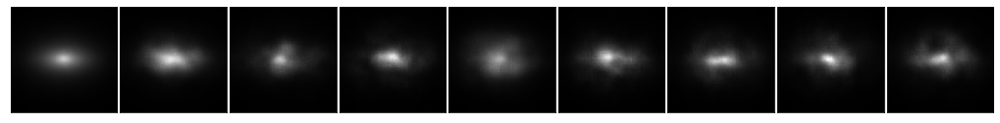

Maximal brightness 1.0147823


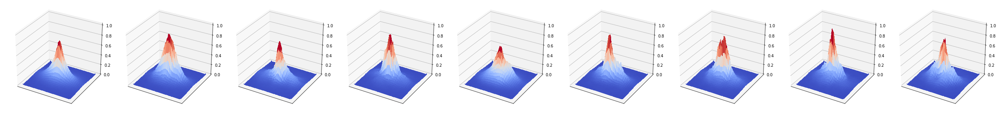

Minimal variance
Maximal brightness 0.9795915


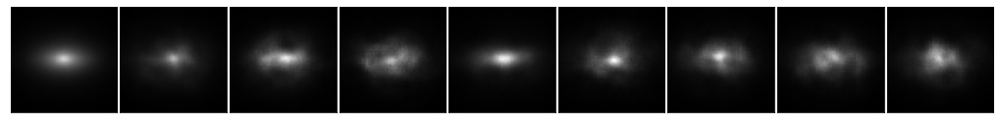

Maximal brightness 0.9795915


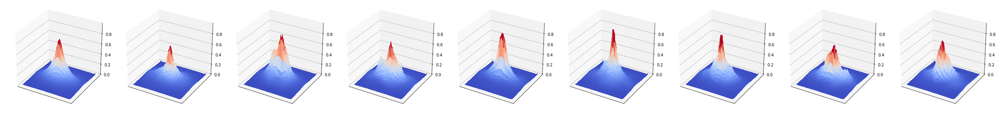

In [ ]:
Analysis.latent_relation_of_variances(SNR,sorted=True)
assess_latent_impact(models_mae,z_means,SNR,number_of_z_to_consider=8)

Maximal brightness 0.91163766


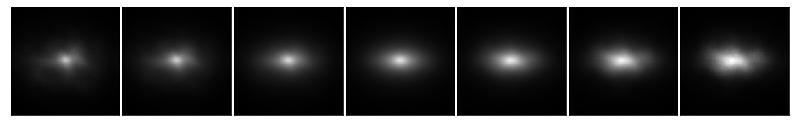

Maximal brightness 0.92929244


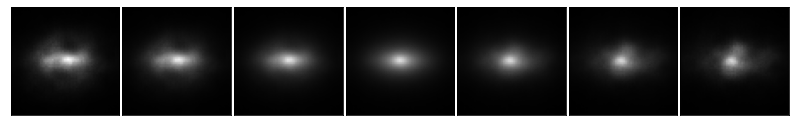

Maximal brightness 0.9219483


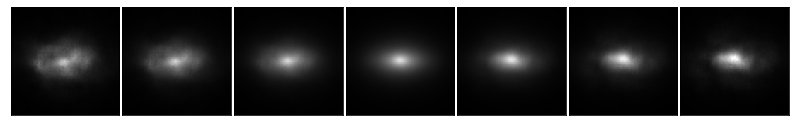

Maximal brightness 0.9083419


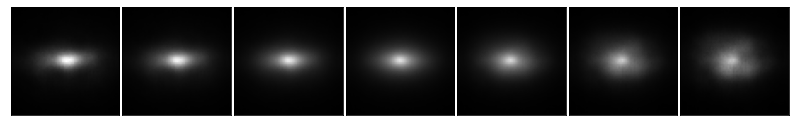

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_mae,z_means,number_of_z_to_consider=4,sort_array=SNR)

Maximal brightness 0.91163766


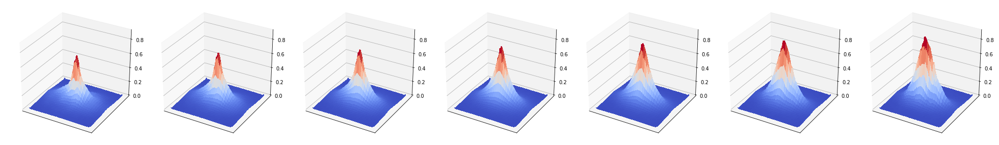

Maximal brightness 0.92929244


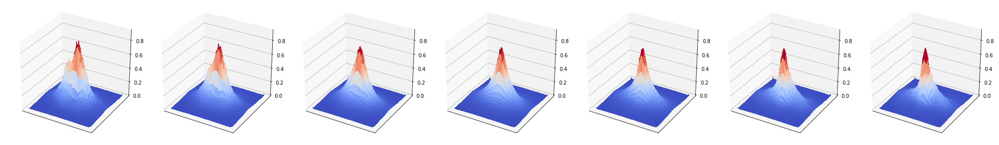

Maximal brightness 0.9219484


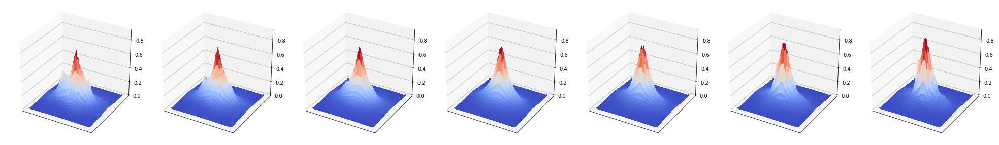

Maximal brightness 0.9083419


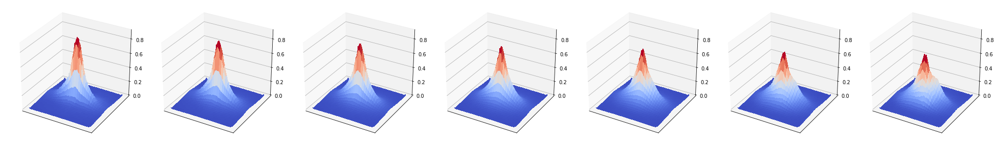

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_mae,z_means,number_of_z_to_consider=4,sort_array=SNR,dimensions='3d')

### SSIM

In [ ]:
z_means,z_log_vars,SNR=predict_latent_space(models_mae_SSIM_FT,gal_dataset_images)

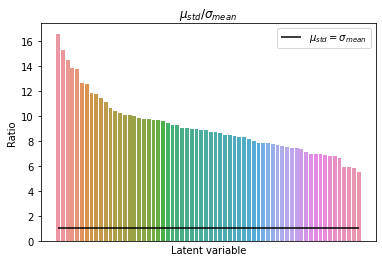

Maximal variance
Maximal brightness 1.053746


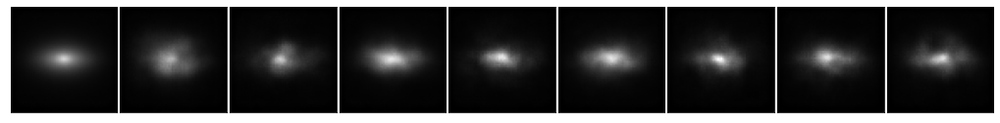

Maximal brightness 1.053746


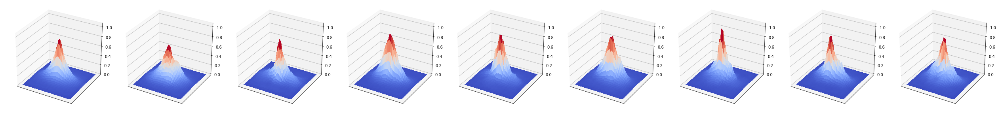

Minimal variance
Maximal brightness 1.0036886


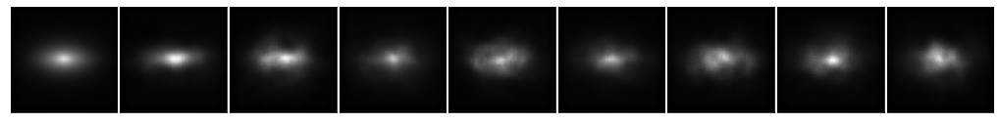

Maximal brightness 1.0036886


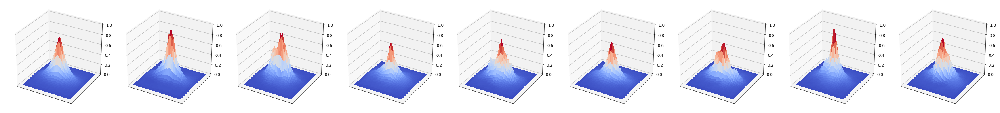

In [ ]:
Analysis.latent_relation_of_variances(SNR,sorted=True)
assess_latent_impact(models_mae_SSIM_FT,z_means,SNR,number_of_z_to_consider=8)

Maximal brightness 0.987749


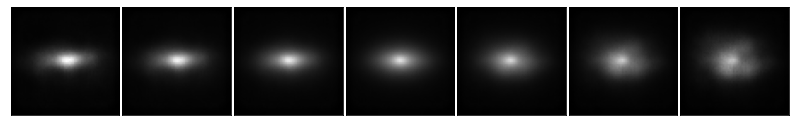

Maximal brightness 0.9765236


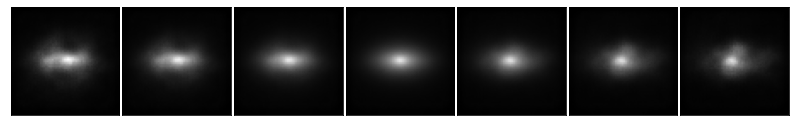

Maximal brightness 0.9480465


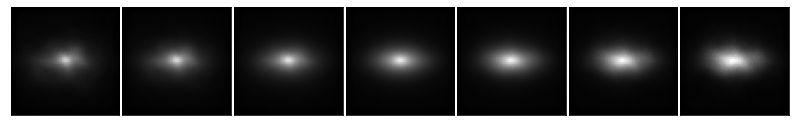

Maximal brightness 0.95747167


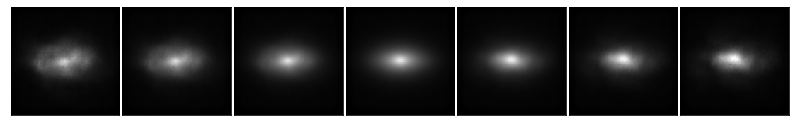

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_mae_SSIM_FT,z_means,number_of_z_to_consider=4,sort_array=SNR)

Maximal brightness 0.987749


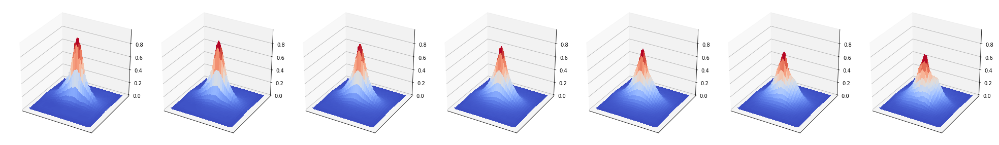

Maximal brightness 0.9765236


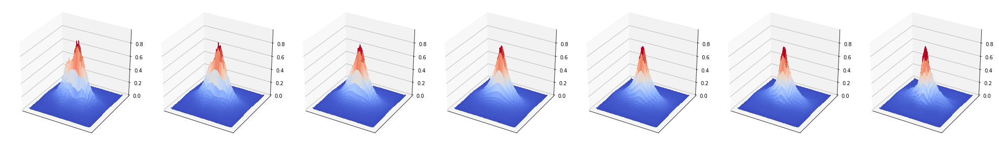

Maximal brightness 0.94804645


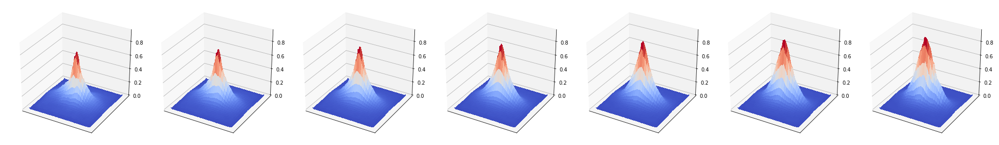

Maximal brightness 0.95747167


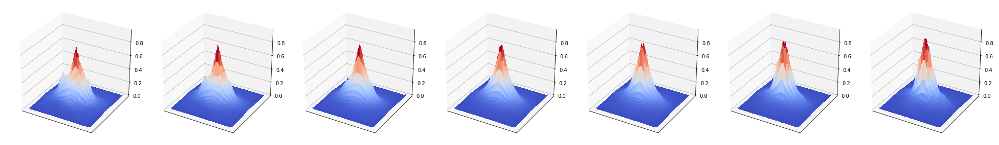

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_mae_SSIM_FT,z_means,number_of_z_to_consider=4,sort_array=SNR,dimensions='3d')

### MAE SSIM

In [ ]:
z_means,z_log_vars,SNR=predict_latent_space(models_mae_MSSSIM_FT,gal_dataset_images)

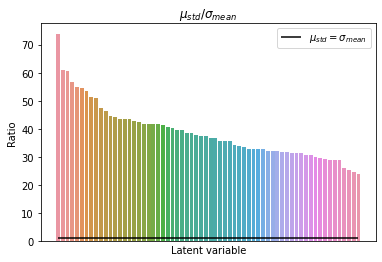

Maximal variance
Maximal brightness 1.0199306


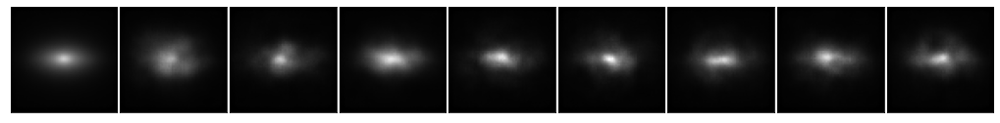

Maximal brightness 1.0199306


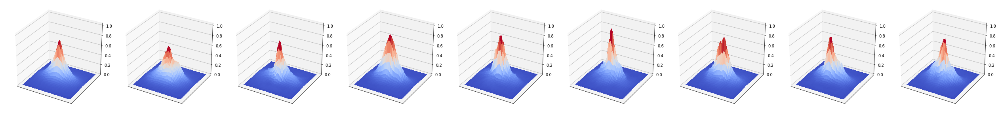

Minimal variance
Maximal brightness 0.95712256


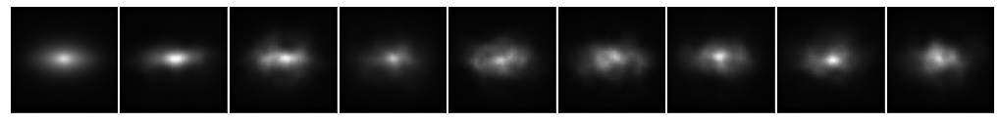

Maximal brightness 0.95712256


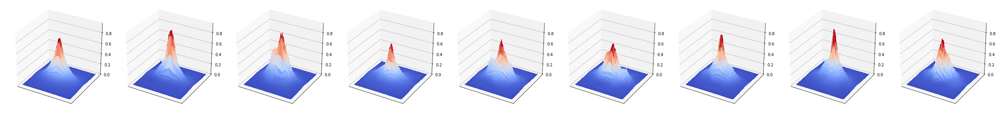

In [ ]:
Analysis.latent_relation_of_variances(SNR,sorted=True)
assess_latent_impact(models_mae_MSSSIM_FT,z_means,SNR,number_of_z_to_consider=8)

Maximal brightness 0.95712435


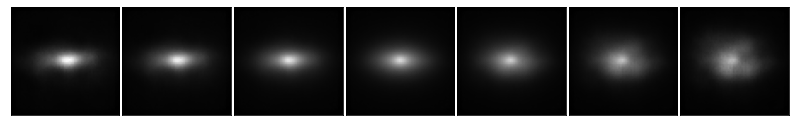

Maximal brightness 0.94020826


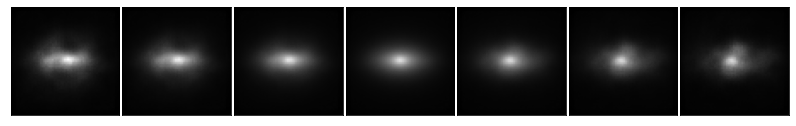

Maximal brightness 0.91092706


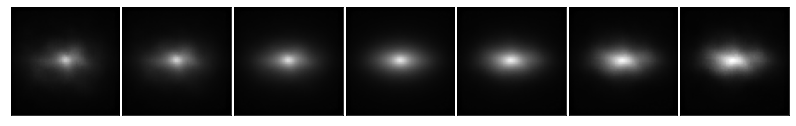

Maximal brightness 0.9088547


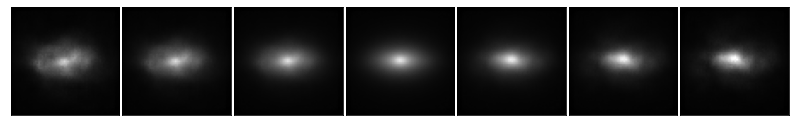

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_mae_MSSSIM_FT,z_means,number_of_z_to_consider=4,sort_array=SNR)

Maximal brightness 0.9571243


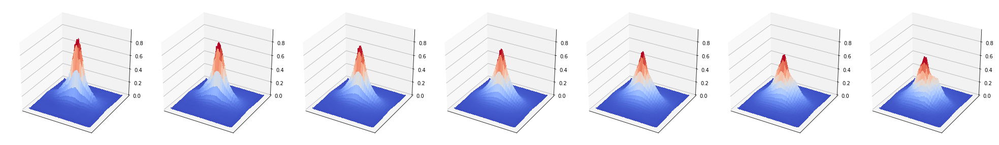

Maximal brightness 0.94020826


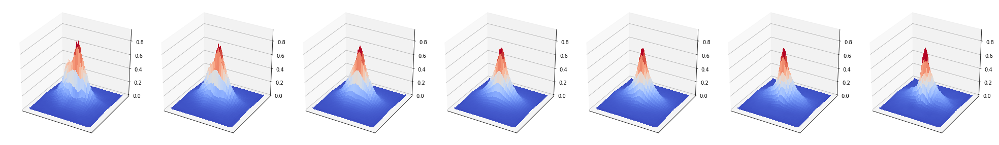

Maximal brightness 0.91092706


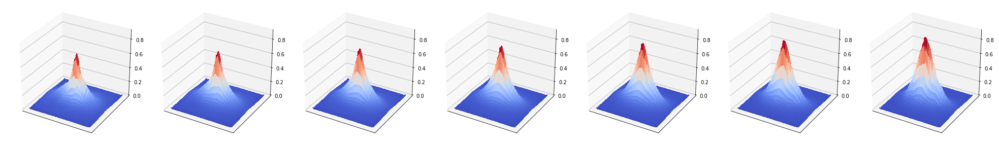

Maximal brightness 0.9088547


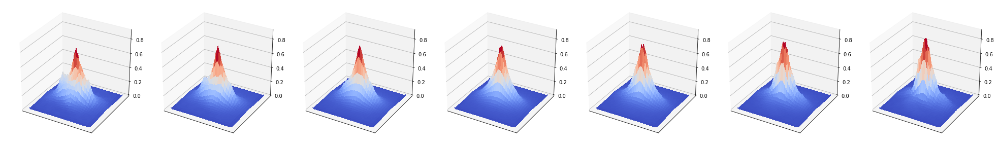

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_mae_MSSSIM_FT,z_means,number_of_z_to_consider=4,sort_array=SNR,dimensions='3d')

### MAE MSE

In [ ]:
z_means,z_log_vars,SNR=predict_latent_space(models_mae_MSE_FT,gal_dataset_images)

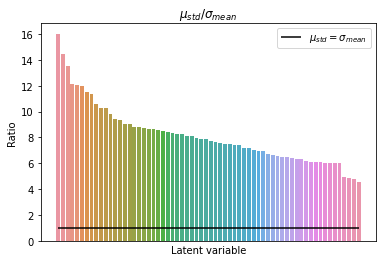

Maximal variance
Maximal brightness 0.9737649


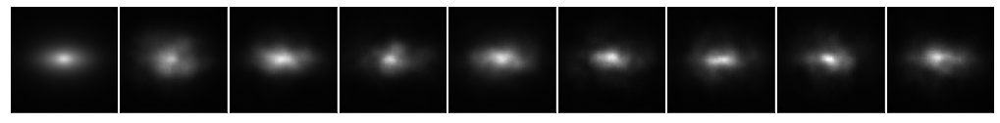

Maximal brightness 0.9737649


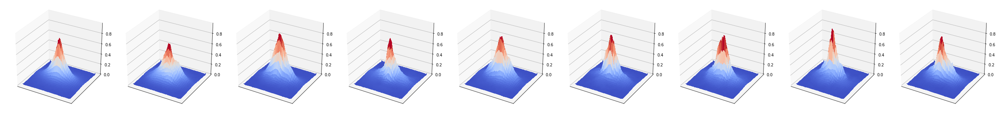

Minimal variance
Maximal brightness 0.9347292


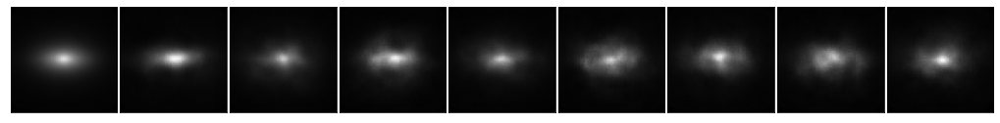

Maximal brightness 0.9347292


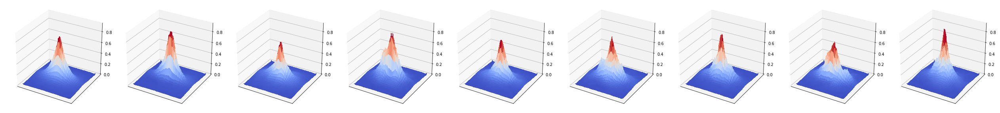

In [ ]:
Analysis.latent_relation_of_variances(SNR,sorted=True)
assess_latent_impact(models_mae_MSE_FT,z_means,SNR,number_of_z_to_consider=8)

Maximal brightness 0.90049624


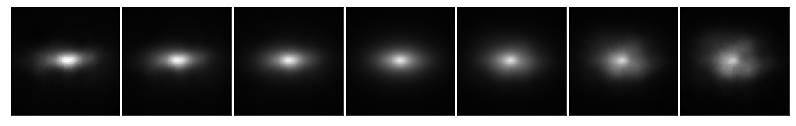

Maximal brightness 0.88291293


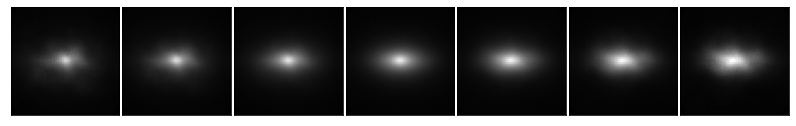

Maximal brightness 0.9023929


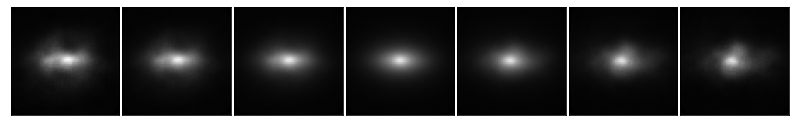

Maximal brightness 0.8860538


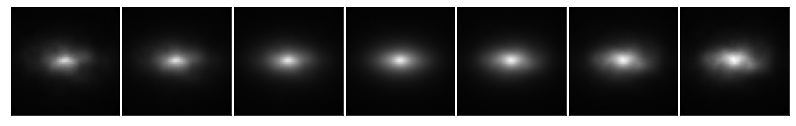

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_mae_MSE_FT,z_means,number_of_z_to_consider=4,sort_array=SNR)

Maximal brightness 0.90049624


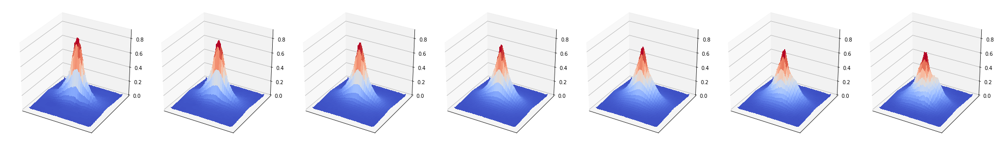

Maximal brightness 0.88291293


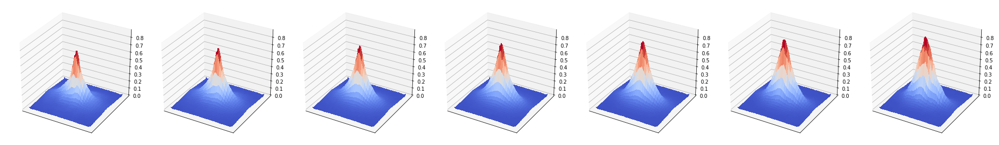

Maximal brightness 0.9023929


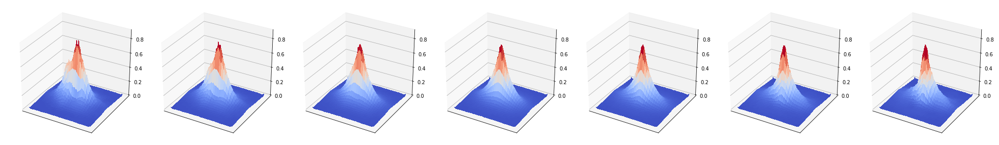

Maximal brightness 0.8860538


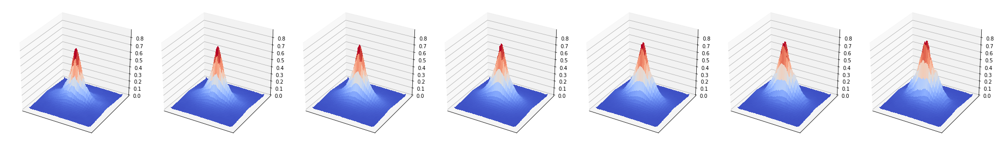

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_mae_MSE_FT,z_means,number_of_z_to_consider=4,sort_array=SNR,dimensions='3d')

### Old BCE

In [ ]:
#Read the images and the features from the google drive
galaxy_images=np.load('/content/drive/My Drive/Lensed Source modelling research/'+'Data/Images_Filtered_Rotated.npy')


#Leave the number of images multiple of the batch_size
Size_of_dataset=len(galaxy_images[:-(len(galaxy_images)%VAE.batch_size)])
Number_of_batches=Size_of_dataset//VAE.batch_size
galaxy_images=galaxy_images[:Size_of_dataset]

#Bring images to a proper tensorial form
gal_dataset_images_old=np.reshape(VAE.normalize_image(copy.deepcopy(galaxy_images)), 
                              (len(galaxy_images), galaxy_images.shape[1], galaxy_images.shape[2], 1)).astype('float32')

In [ ]:
z_means,z_log_vars,SNR=predict_latent_space(models_Old_BCE,gal_dataset_images_old)

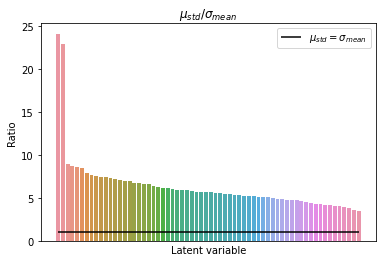

Maximal variance
Maximal brightness 0.9001361


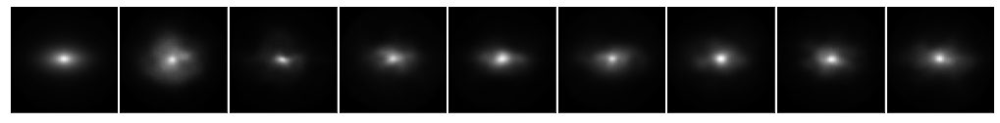

Maximal brightness 0.9001361


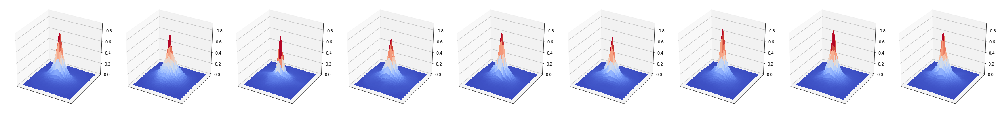

Minimal variance
Maximal brightness 0.9395084


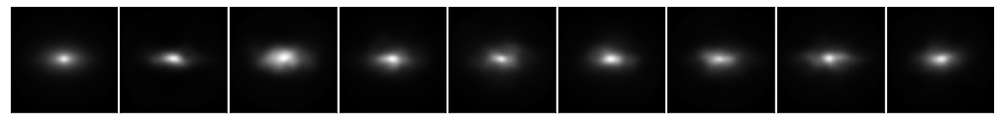

Maximal brightness 0.9395084


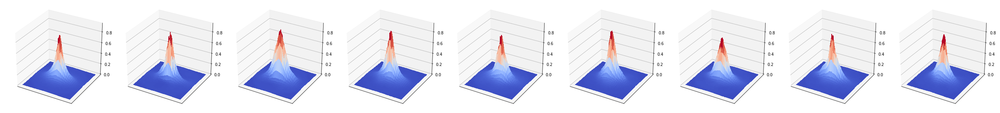

In [ ]:
Analysis.latent_relation_of_variances(SNR,sorted=True)
assess_latent_impact(models_Old_BCE,z_means,SNR,number_of_z_to_consider=8)

Maximal brightness 0.89297605


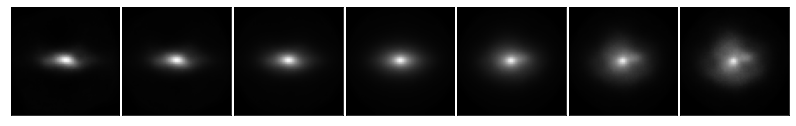

Maximal brightness 0.9395084


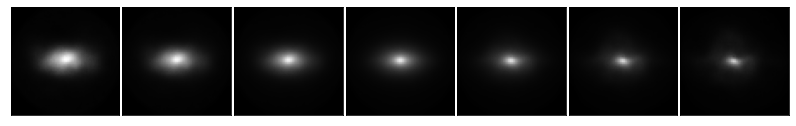

Maximal brightness 0.91424066


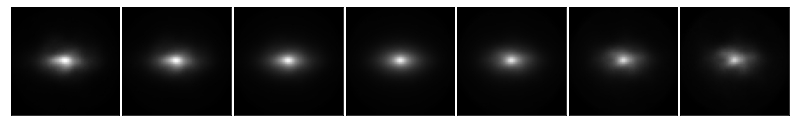

Maximal brightness 0.85500693


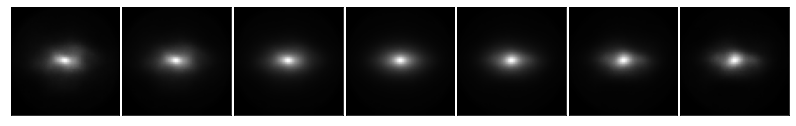

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_Old_BCE,z_means,number_of_z_to_consider=4,sort_array=SNR)

### Old chi_sq

In [ ]:
z_means,z_log_vars,SNR=predict_latent_space(models_Old_chi_sq,gal_dataset_images_old)

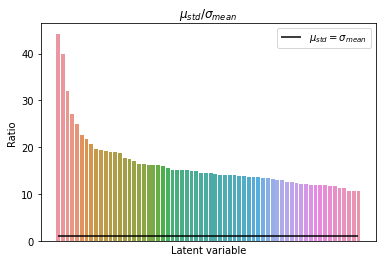

Maximal variance
Maximal brightness 1.0116391


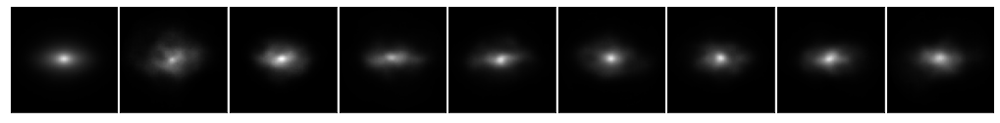

Maximal brightness 1.0116391


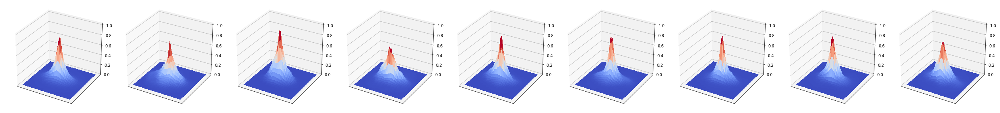

Minimal variance
Maximal brightness 1.0195036


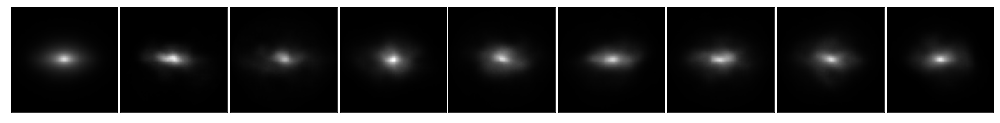

Maximal brightness 1.0195036


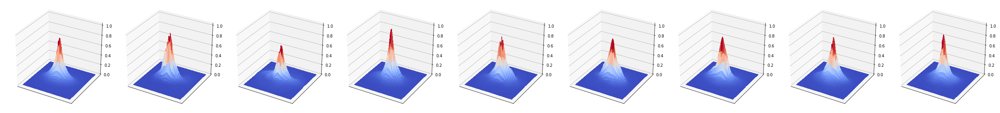

In [ ]:
Analysis.latent_relation_of_variances(SNR,sorted=True)
assess_latent_impact(models_Old_chi_sq,z_means,SNR,number_of_z_to_consider=8)

Maximal brightness 0.9542433


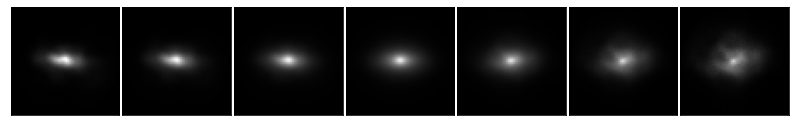

Maximal brightness 1.0116398


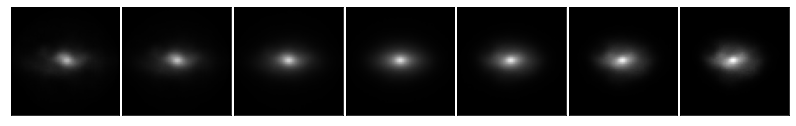

Maximal brightness 1.0195036


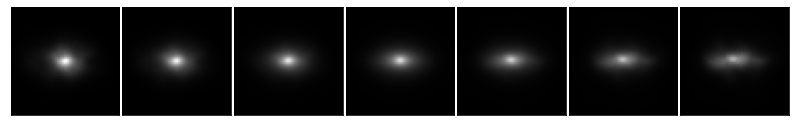

Maximal brightness 0.8831044


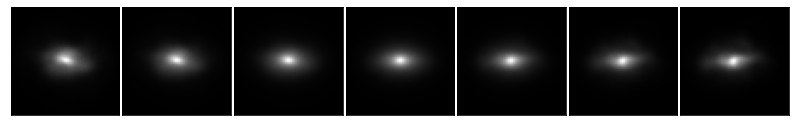

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_Old_chi_sq,z_means,number_of_z_to_consider=4,sort_array=SNR)

Maximal brightness 0.9542433


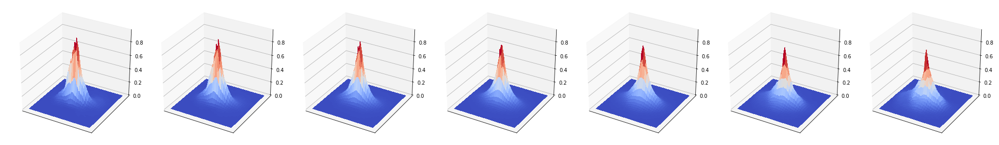

Maximal brightness 1.0116398


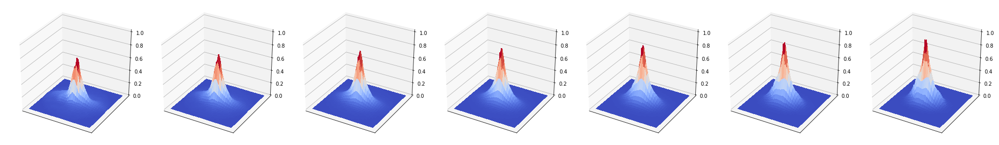

Maximal brightness 1.0195038


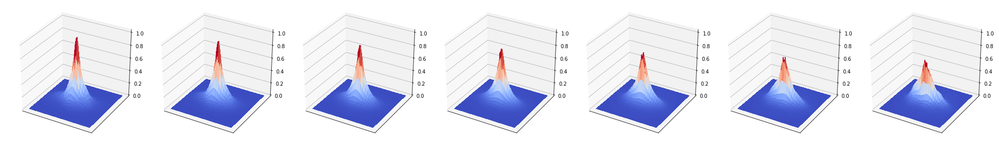

Maximal brightness 0.8831043


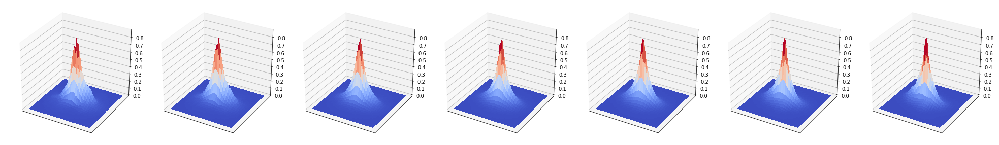

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_Old_chi_sq,z_means,number_of_z_to_consider=4,sort_array=SNR,dimensions='3d')

## Comparison with PCA

In [ ]:
def assess_latent_impact(models,z_means,SNR,number_of_z_to_consider=8):
    latent_average=z_means.mean(axis=0)
    #Latent variables sorted in decresaing SNR
    variables_to_consider=np.argsort(SNR)[::-1][:number_of_z_to_consider]
    variances_to_consider=z_means.std(axis=0)[variables_to_consider]
    #Sample mean+3*sigma and mean-3*sigma
    z_max=np.zeros((number_of_z_to_consider+1,64))
    z_min=np.zeros((number_of_z_to_consider+1,64))

    #i - number of variable to change
    for i in range(number_of_z_to_consider+1):
      #Vary the latent variables if i!=0
      z_max[i,:]=latent_average
      z_min[i,:]=latent_average
      if i!=0:
        z_max[i,variables_to_consider[i-1]]+=3*variances_to_consider[i-1]
        z_min[i,variables_to_consider[i-1]]-=3*variances_to_consider[i-1]
      
    #Decode latent space
    Max_variance_images=models['decoder'].predict(z_max)
    Min_variance_images=models['decoder'].predict(z_min)

    print("Maximal variance")
    Analysis.plot_galaxies(Max_variance_images,dimensions='2d')
    Analysis.plot_galaxies(Max_variance_images,dimensions='3d')
    
    print("Minimal variance")
    Analysis.plot_galaxies(Min_variance_images,dimensions='2d')
    Analysis.plot_galaxies(Min_variance_images,dimensions='3d')

best latent space (still quite a shit actually)

In [ ]:
z_means,z_log_vars,SNR=predict_latent_space(models_mae_SSIM_FT,gal_dataset_images)

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=64)
pca.fit_transform(z_means)
Principal_components=pca.transform(z_means)
Principal_means=Principal_components.mean(axis=0)
Principal_stds=Principal_components.std(axis=0)

Maximal brightness 0.98774827


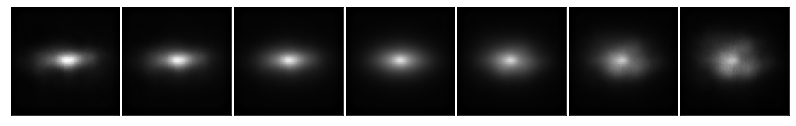

Maximal brightness 0.9765229


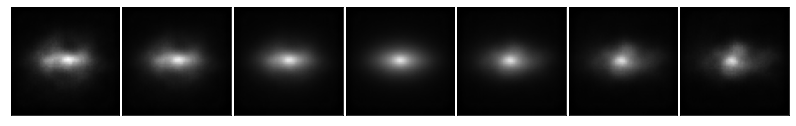

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models_mae_SSIM_FT,z_means,number_of_z_to_consider=2,sort_array=SNR)

Explained variance ratio [0.5037364  0.05394042]
Maximal brightness 0.86500967


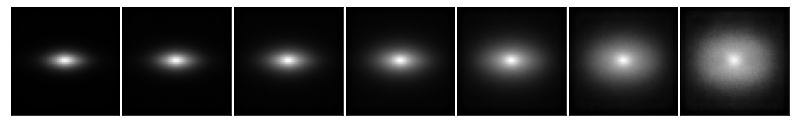

Maximal brightness 0.88267255


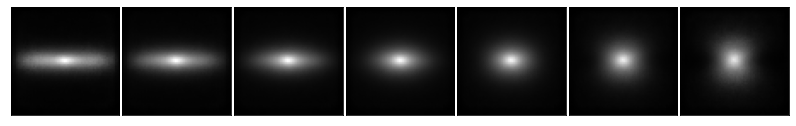

In [ ]:
Analysis.galaxy_properties_from_PCA(models_mae_SSIM_FT,z_means,n_components=2)

In [ ]:
  PC=np.zeros((64,7,64))
  #i - number of variable to change
  for i in range(2):
    #j - number of sigmas to add to it
    for j in range(7):
      #Assign everything to be like average galaxy
        PC[i,j,:]=Principal_means
        PC[i,j,i]+=(j-3)*Principal_stds[i]

  z_to_consider=pca.inverse_transform(PC)

In [ ]:
z_from_PCA_max=z_to_consider[0,-1]
z_from_PCA_min=z_to_consider[0,0]

In [ ]:
z_from_latent_max=z_means.mean(axis=0)
z_from_latent_min=z_means.mean(axis=0)
variables_to_consider=np.argsort(SNR)[::-1][0]
z_from_latent_max[variables_to_consider]+=+3*z_means.std(axis=0)[variables_to_consider]
z_from_latent_min[variables_to_consider]+=-3*z_means.std(axis=0)[variables_to_consider]

In [ ]:
z_to_predict=np.zeros((2,2,64))
z_to_predict[0,0]=z_from_latent_min
z_to_predict[1,0]=z_from_latent_max

z_to_predict[0,1]=z_from_PCA_min
z_to_predict[1,1]=z_from_PCA_max

In [ ]:
Varied_size_imgs=models_mae_SSIM_FT['decoder'].predict(z_to_predict.reshape((4,64))).reshape((2,2,64,64,1))

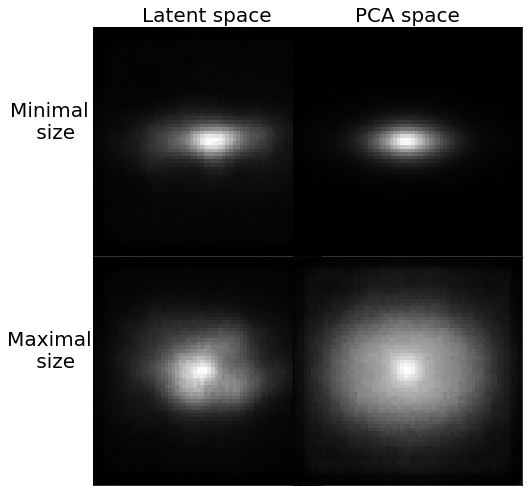

In [ ]:
fig,ax=plt.subplots(2,2,figsize=(10,7))

titles=['Latent size increase','Average galaxy','PCA size increase']
#labels=['Latent size','','PCA size']

ax[0,0].set_title('Latent space',fontsize=20)
ax[0,1].set_title('PCA space',fontsize=20)

h=ax[0,0].set_ylabel('Minimal \n size',fontsize=20,rotation=0,labelpad=40)
h=ax[1,0].set_ylabel('Maximal \n size',fontsize=20,rotation=0,labelpad=40)

for i in range(2):
  for j in range(2):
    ax[i,j].imshow(Varied_size_imgs[i,j,:,:,0],cmap='gray')
    #ax[i].set_title(titles[i],fontsize=15)
    #ax[i].axis('off')
    ax[i,j].set_xticks([])
    ax[i,j].set_yticks([])
    #ax[i].set_xlabel('{:.2f}'.format(comparison_mse.mean(axis=-1).mean(axis=-1)[::-1][i-1]*1e+3),fontsize=13)

plt.tight_layout(w_pad=-17.5,h_pad=-0.3)

In [ ]:

  if i==0:
    ax[i].set_xlabel(r'$1000 \times $'+'MSE:',fontsize=13)
    ax[i].set_title('Ground truth',fontsize=15)
  if i>0:
    #ax[i].text(34, 62,'Loss={:.1f}'.format(comparison_mse.mean(axis=-1).mean(axis=-1)[i]*1e+4), color='red',size=10,weight="bold")
    ax[i].set_xlabel('{:.2f}'.format(comparison_mse.mean(axis=-1).mean(axis=-1)[::-1][i-1]*1e+3),fontsize=13)
    ax[i].set_title(fig_titles[::-1][i-1],fontsize=15)

Maximal brightness 0.8650099


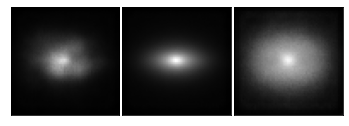

In [ ]:
Analysis.plot_galaxies(Varied_size_imgs)

## DKL learning curves

In [ ]:
models_BCE,_,_,_=VAE.get_VAE('sigmoid','binary_crossentropy',beta_vae=1e-2)
models_BCE['vae'].load_weights('/content/drive/My Drive/Lensed Source modelling research/'\
                                  +'Models/MAD_estimated_noise/BCE_Sigmoid_beta=1e-2_new_DS/'+'epoch_{}/Model'.format(197))
'''
models_chi_sq,_,_,_=VAE.get_VAE('softplus','chi_sq',beta_vae=1e-2)
models_chi_sq['vae'].load_weights('/content/drive/My Drive/Lensed Source modelling research/'\
                                  +'Models/MAD_estimated_noise/Chisq_beta=1e-4_new_DS/'+'epoch_{}/Model'.format(131))'''

models_chi_sq,_,_,_=VAE.get_VAE('softplus','chi_sq',beta_vae=1e-2)
models_chi_sq['vae'].load_weights('/content/drive/My Drive/Lensed Source modelling research/'\
                                  +'Models/MAD_estimated_noise/Correct_chi_sq/Chisq_lowered_700_chisq_SNR=30_beta=1e-3_new_DS/'+'epoch_{}/Model'.format(70))


models_mae,_,_,_=VAE.get_VAE('softplus','mae',beta_vae=1e-2)
models_mae['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/MAE+Softplus/beta_vae=1e-2/'+'epoch_{}/Model'.format(130))

models_mae_SSIM_FT,_,_,_=VAE.get_VAE('softplus','SSIM',beta_vae=1e-2)
models_mae_SSIM_FT['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/Pretrain_MAE_beta=1e-2_epoch_130/SSIM_beta=0.5*1e-4/'+'epoch_{}/Model'.format(70))


models_mae_MSSSIM_FT,_,_,_=VAE.get_VAE('softplus','SSIM',beta_vae=1e-2)
models_mae_MSSSIM_FT['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/Pretrain_MAE_beta=1e-2_epoch_130/0.5_MAE_SSIM_beta=0.5*1e-4/'+'epoch_{}/Model'.format(80))


models_mae_MSE_FT,_,_,_=VAE.get_VAE('softplus','SSIM',beta_vae=1e-2)
models_mae_MSE_FT['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/Pretrain_MAE_beta=1e-2_epoch_130/3*MSE_beta=1e-2/'+'epoch_{}/Model'.format(80))

0 130 130


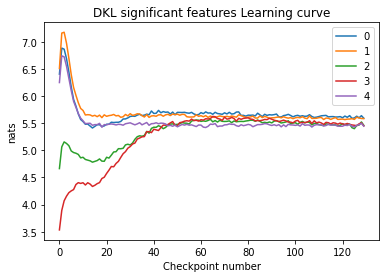

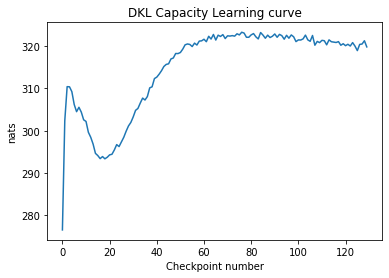

In [ ]:
Analysis.DKL_learning_curve('/content/drive/My Drive/TP4b/'\
                                  +'Models/MAE+Softplus/beta_vae=1e-2/DKL.txt',start_epoch=0,stop_epoch=1000000)

In [12]:
models_mae_MSE_FT,_,_,_=VAE.get_VAE('softplus','mse',beta_vae=1e-2)
models_mae_MSE_FT['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/Pretrain_MAE_beta=1e-2_epoch_130/3*MSE_beta=1e-2/'+'epoch_{}/Model'.format(80))

0 130 130


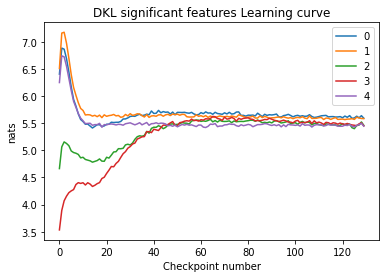

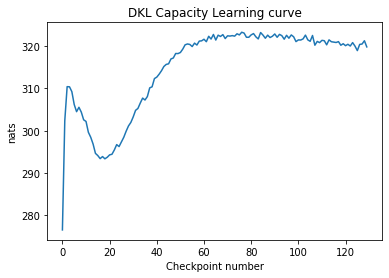

In [13]:
Analysis.DKL_learning_curve('/content/drive/My Drive/TP4b/'\
                                  +'Models/MAE+Softplus/beta_vae=1e-2/DKL.txt',start_epoch=0,stop_epoch=1000000)

0 85 85


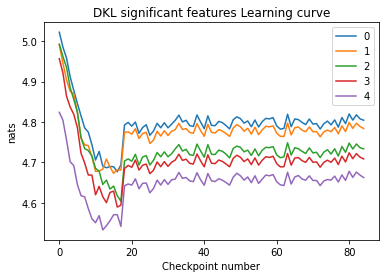

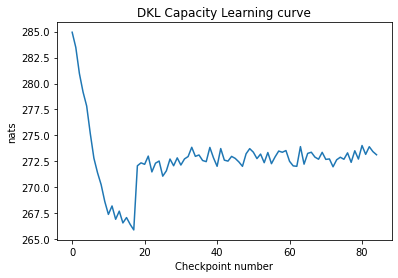

In [14]:
Analysis.DKL_learning_curve('/content/drive/My Drive/TP4b/'\
                                  +'Models/Pretrain_MAE_beta=1e-2_epoch_130/3*MSE_beta=1e-2/DKL.txt',start_epoch=0,stop_epoch=1000000)

In [17]:
decoded_test=models_mae_MSE_FT['decoder'].predict(models_mae_MSE_FT['z_meaner'].predict(x_test))

In [ ]:
        images=images_labeled[:,:-1,:,:]
        #Amplitudes and gaussian noises
        labels=images_labeled[:,-1,:,0]


        fig,ax=plt.subplots(1,3,figsize=(10,5))
        maxima=K.eval(decoded).max(axis=(1,2,3))
        #Relative absolute error for images_true normalized to 1.
        maxima_RAE=np.abs(maxima-1)
        ax[0].hist(maxima,bins=20)
        ax[0].set_title('Distribution of reconstructed maximum')

        reconstruction_loss=K.eval(K.mean(reconstruction_loss_function(images,decoded,labels),axis=[1,2]))
        reconstruction_loss=np.sort(reconstruction_loss)[:int(len(reconstruction_loss)*0.99)]
        ax[1].hist(reconstruction_loss,bins=40)
        ax[1].set_title('reconstruction loss')

        SSIM=tf.image.ssim(images.astype('double'), decoded.astype('double'),max_val=1,filter_size=8).numpy()
        ax[2].hist(SSIM,bins=20)
        ax[2].set_title('SSIM')
        plt.show()

        print('Max values RAE {:.3f} ± {:.3f}, median {:.3f}'.format(maxima_RAE.mean(),maxima_RAE.std(),np.median(maxima_RAE)))
        print('reconstruction loss values {:.6f} ± {:.6f}, median {:.6f}'.format(reconstruction_loss.mean(),reconstruction_loss.std(),np.median(reconstruction_loss)))
        print('SSIM values {:.3f} ± {:.3f}, median {:.3f}'.format(SSIM.mean(),SSIM.std(),np.median(SSIM)))

In [26]:
maxima=K.eval(decoded_test).max(axis=(1,2,3))
maxima_RAE=np.abs(maxima-1)

y_true = tf.convert_to_tensor(x_test)
y_pred = tf.convert_to_tensor(decoded_test)

MSE=K.eval(K.mean(K.square(y_true-y_pred),axis=[1,2,3]))
SSIM=tf.image.ssim(x_test.astype('double'), decoded_test.astype('double'),max_val=1,filter_size=8).numpy()

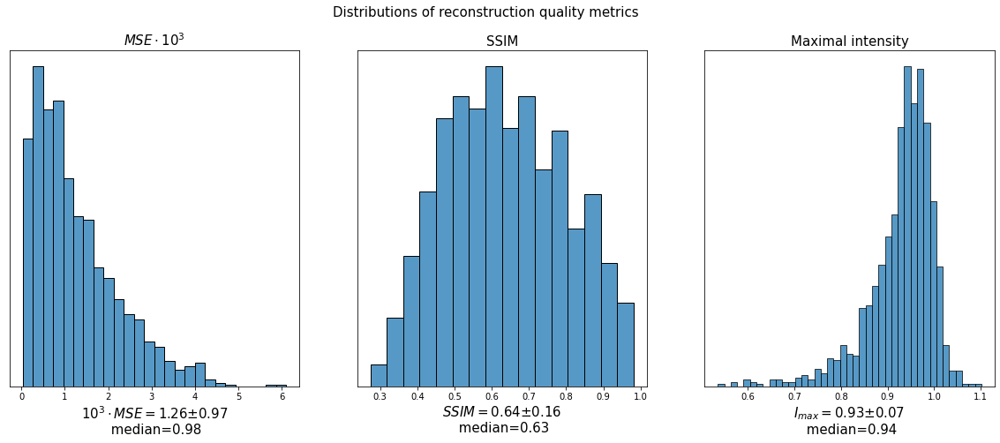

In [50]:
import seaborn as sns
fig,ax=plt.subplots(1,3,figsize=(20,7))

sns.histplot(ax=ax[0],x=MSE*1e+3)
sns.histplot(ax=ax[1],x=SSIM)
sns.histplot(ax=ax[2],x=maxima)

ax[0].set_title(r'$MSE \cdot 10^3$',fontsize=15)
ax[1].set_title('SSIM',fontsize=15)
ax[2].set_title('Maximal intensity',fontsize=15)

ax[0].set_xlabel(r'$10^3 \cdot MSE=${:.2f}$\pm${:.2f}'.format(MSE.mean()*1e+3,MSE.std()*1e+3)\
                 +'\n median={:.2f}'.format(np.median(MSE*1e+3)),fontsize=15)

ax[1].set_xlabel(r'$SSIM=${:.2f}$\pm${:.2f}'.format(SSIM.mean(),SSIM.std())\
                 +'\n median={:.2f}'.format(np.median(SSIM)),fontsize=15)

ax[2].set_xlabel(r'$I_{max}=$'+'{:.2f}$\pm${:.2f}'.format(maxima.mean(),maxima.std())\
                 +'\n median={:.2f}'.format(np.median(maxima)),fontsize=15)

fig.suptitle('Distributions of reconstruction quality metrics',fontsize=15)
for i in range(3):
  ax[i].set_ylabel('')
  ax[i].set_yticks([])

In [53]:
(df['Noise_sigma']**2).describe()

count    2.547200e+04
mean     3.106308e-04
std      2.693582e-04
min      5.411932e-08
25%      8.200555e-05
50%      2.308061e-04
75%      4.887894e-04
max      9.995568e-04
Name: Noise_sigma, dtype: float64

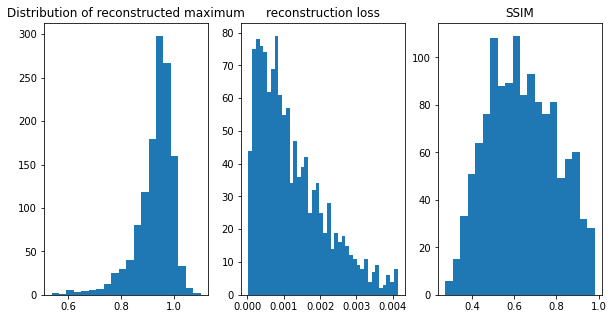

Max values RAE 0.074 ± 0.068, median 0.056
reconstruction loss values 0.001225 ± 0.000914, median 0.000974
SSIM values 0.638 ± 0.161, median 0.627


In [20]:
Analysis.numerical_reconstruction_quality(x_test_labeled,decoded_test,VAE.get_reconstruction_loss('mse'))

# PCA space

In [ ]:
#Vary each of PCA components of the transformed latent space and consider its impact on the image
def galaxy_properties_from_PCA(models,z_means,n_components=4,dimensions='2d'):
  pca = PCA(n_components=n_components)
  pca.fit(z_means)
  Principal_components=pca.transform(z_means)
  Principal_means=Principal_components.mean(axis=0)
  Principal_stds=Principal_components.std(axis=0)

  PC=np.zeros((n_components,7,n_components))
  #i - number of variable to change
  for i in range(n_components):
    #j - number of sigmas to add to it
    for j in range(7):
      #Assign everything to be like average galaxy
        PC[i,j,:]=Principal_means
        PC[i,j,i]+=(j-3)*Principal_stds[i]

  z_to_consider=pca.inverse_transform(PC)
  print('Explained variance ratio',pca.explained_variance_ratio_)
  images_to_consider=models['decoder'].predict(z_to_consider.reshape((n_components*7,64)))
  #plot_digits(images_to_consider[:7],images_to_consider[7:14])
  if (dimensions=='2d') or (dimensions='3d')
    for i in range(n_components):
      plot_galaxies(images_to_consider[i*7:(i+1)*7],dimensions=dimensions)
  elif dimensions=='slice':
    

In [5]:
models_mae_MSE_FT,_,_,_=VAE.get_VAE('softplus','SSIM',beta_vae=1e-2)
models_mae_MSE_FT['vae'].load_weights('/content/drive/My Drive/TP4b/'\
                                  +'Models/Pretrain_MAE_beta=1e-2_epoch_130/3*MSE_beta=1e-2/'+'epoch_{}/Model'.format(80))

In [7]:
z_means=models_mae_MSE_FT['z_meaner'].predict(gal_dataset_images)

In [13]:
from sklearn.decomposition import PCA
pca = PCA(n_components=64)
pca.fit(z_means)
Principal_components=pca.transform(z_means)
Principal_means=Principal_components.mean(axis=0)
Principal_stds=Principal_components.std(axis=0)

In [89]:
from matplotlib import cm
def vary_PCA_feature(models,pca,Principal_means,Principal_stds,feature_number=0,present='2d',slice_type='x'):

  PC=np.zeros((7,64))
  for j in range(7):
    #Assign everything to be like average galaxy
    PC[j,:]=Principal_means
    PC[j,feature_number]+=(j-3)*Principal_stds[feature_number]
  z_to_consider=pca.inverse_transform(PC)
  print('Explained variance={:.1f} %'.format(pca.explained_variance_ratio_[feature_number]*100))
  images_to_consider=models_mae_MSE_FT['decoder'].predict(z_to_consider)


  x = np.linspace(0, 64, 64)
  y = np.linspace(0, 64, 64)
  X, Y = np.meshgrid(x, y)

  fig=plt.figure(figsize=(21,3))


  for j in range(7):
    if present=='2d':
        ax = fig.add_subplot(1,7,j+1)
        ax.imshow(images_to_consider[j,:,:,0],cmap='gray')
    elif present=='3d':
        ax = fig.add_subplot(1,7,j+1, projection='3d')
        ax.plot_surface(X, Y, images_to_consider[j,:,:,0], cmap=cm.coolwarm,
                            linewidth=0, antialiased=False)
        ax.set_zlim(0,images_to_consider.max())
    elif present=='slice':
        ax = fig.add_subplot(1,7,j+1)
        if slice_type=='x':
          plot=images_to_consider[j,32,:,0] 
        else:
          plot=images_to_consider[j,:,32,0]
        ax.plot(plot)
        ax.set_ylim(0,images_to_consider.max())
    
    ax.set_yticks([])
    ax.set_xticks([])
    if j!=3:
      ax.set_title('{:d}'.format((j-3))+r'$\cdot \sigma$',fontsize=20)
  plt.show()

def show_feature(index,present='2d',slice_type='x'):
  vary_PCA_feature(models_mae_MSE_FT,pca,Principal_means,Principal_stds,index,present,slice_type)

Explained variance=50.0 %


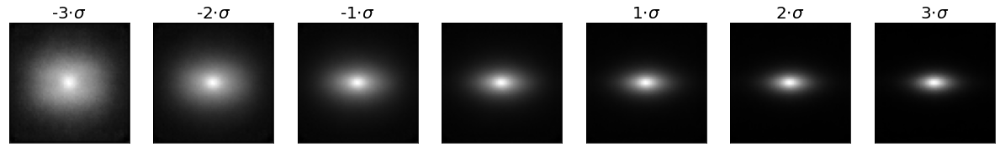

In [54]:
#size
show_feature(0)

Explained variance=5.1 %


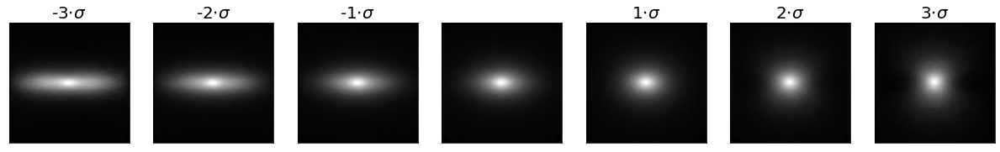

In [56]:
#ellipticity
show_feature(1)

Explained variance=3.9 %


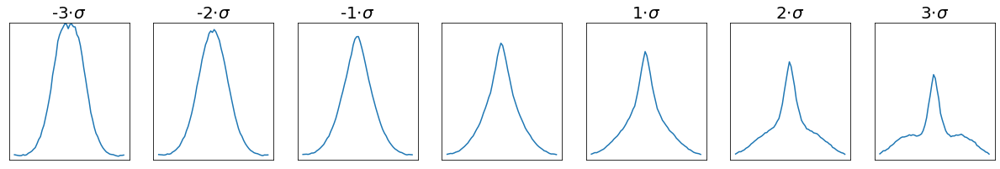

In [64]:
#amplitude bulge/disk
show_feature(2,'slice')

Explained variance=3.8 %


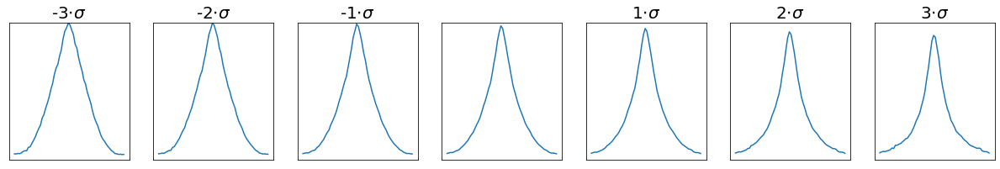

In [70]:
#power slope
show_feature(3,'slice')

Explained variance=2.0 %


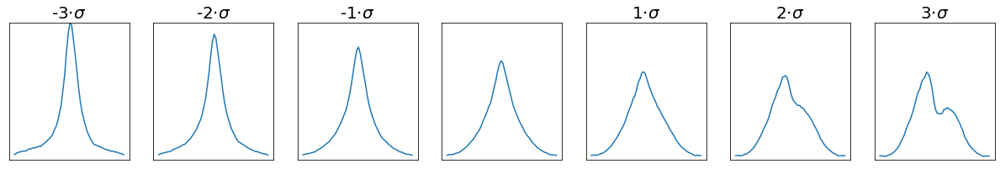

In [72]:
#Second intensity peak on right
show_feature(4,'slice')

Explained variance=1.9 %


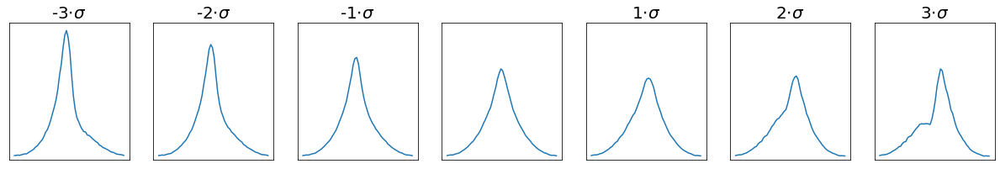

In [74]:
#second intensity peak on left
show_feature(5,'slice')

Explained variance=1.9 %


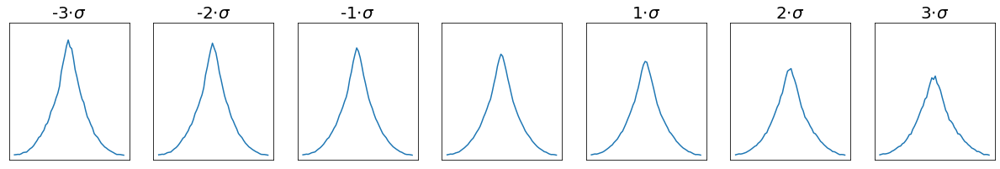

Explained variance=1.9 %


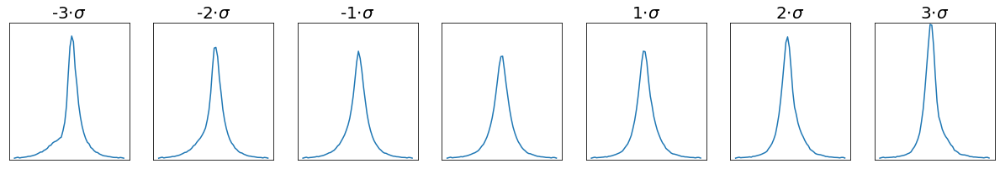

Explained variance=1.9 %


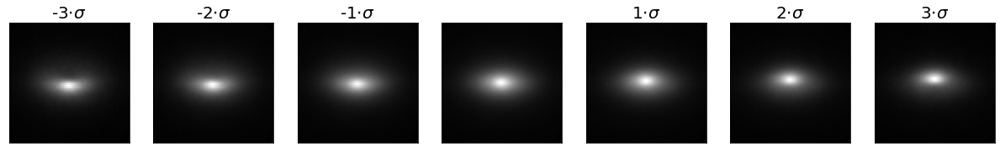

In [97]:
#This one should be considered separately in appendix. The natural basis for this feature is rotated with respect to usual x,y

#shift of the peak to the top left
show_feature(6,'slice','x')
show_feature(6,'slice','y')
show_feature(6)

Explained variance=1.6 %


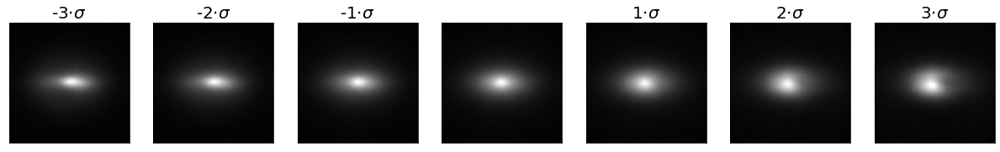

Explained variance=1.6 %


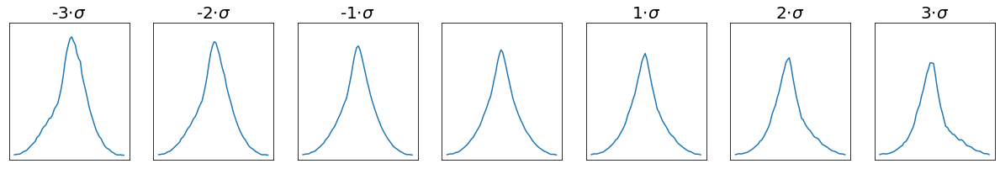

In [96]:
#Another shift of the peak to bottow left
show_feature(7)
show_feature(7,'slice','x')

Explained variance=1.4 %


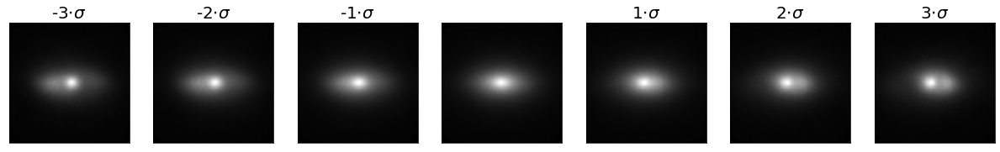

Explained variance=1.4 %


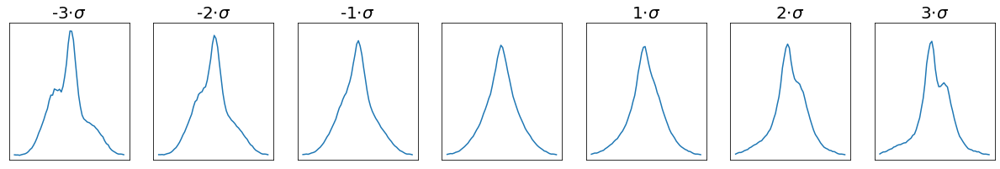

In [99]:
show_feature(8)
show_feature(8,'slice')

Explained variance=1.3 %


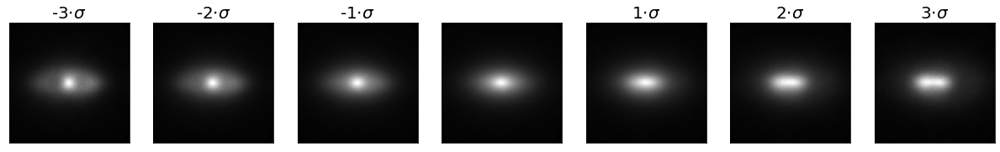

Explained variance=1.3 %


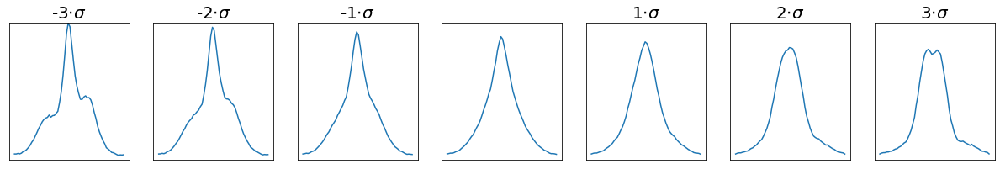

In [101]:
show_feature(9)
show_feature(9,'slice')

Explained variance=1.2 %


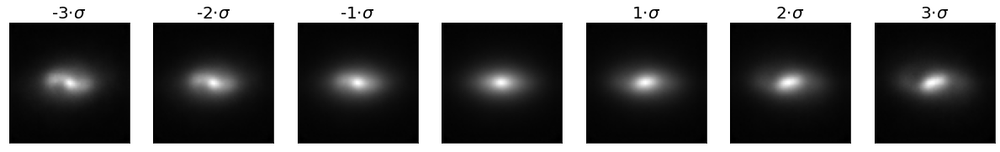

In [104]:
#Barely resolved rotation of spiral arms
show_feature(10)

Explained variance=1.1 %


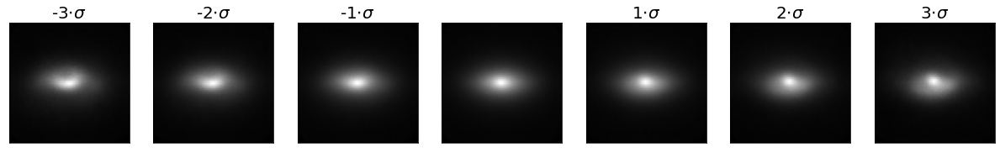

Explained variance=1.1 %


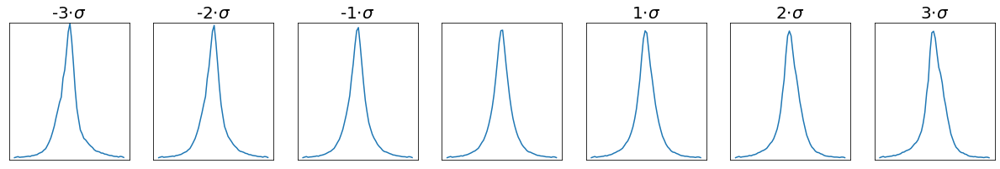

In [109]:
#same idea as for 6
show_feature(11)
show_feature(11,'slice','y')

Explained variance=1.1 %


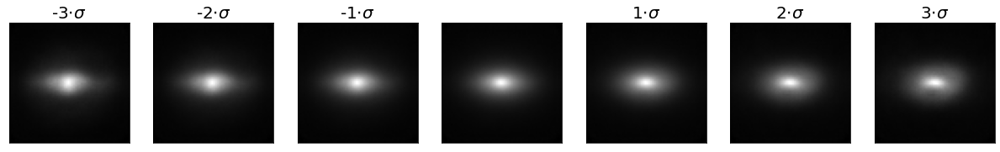

Explained variance=1.1 %


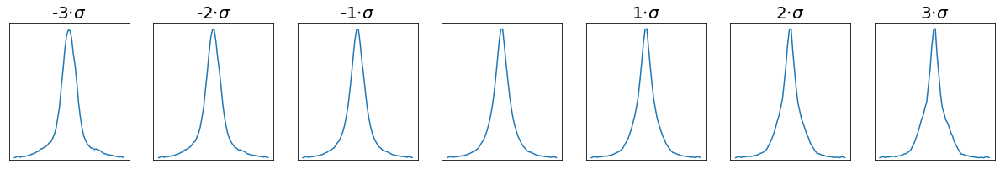

In [112]:
#entangled power slope?
show_feature(12)
show_feature(12,'slice','y')

Explained variance=1.1 %


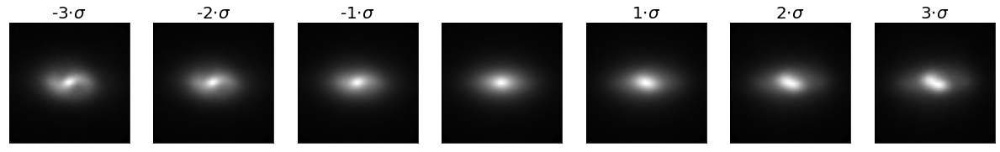

In [113]:
#Barely resolved rotation of spiral arms like 10 (show them together)
show_feature(13)

Explained variance=1.0 %


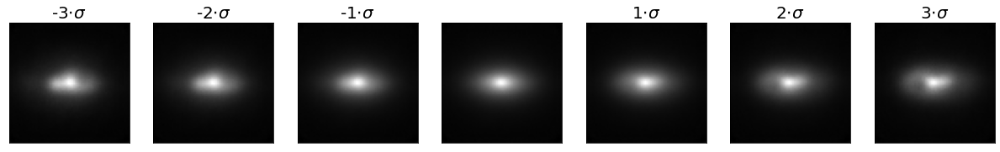

In [114]:
show_feature(14)

Explained variance=1.0 %


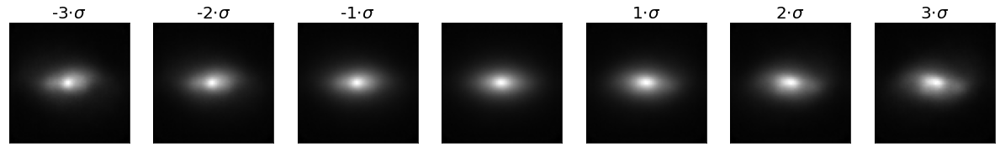

In [117]:
show_feature(15)

Explained variance=0.9 %


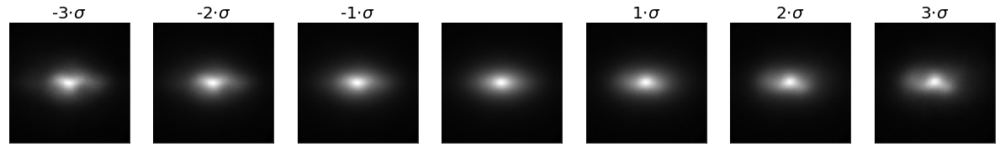

In [118]:
show_feature(16)

# MAE

In [ ]:
beta_vae=1e-2
activation='softplus'
loss_type='mse'

models,model_loss_function,reconstruction_loss_function,regularization_loss_function=\
  VAE.get_VAE(activation,loss_type,beta_vae=beta_vae)

Checkpoint_to_load=130
Checkpoint_name='Models/MAE+Softplus/beta_vae=1e-2/'
Checkpoints_Folder=Folder+Checkpoint_name

models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

In [ ]:
z_means=models['z_meaner'].predict(gal_dataset_images)
z_log_vars=models['z_log_varer'].predict(gal_dataset_images)
decoded=models['vae'].predict(gal_dataset_images)
std_of_mu=z_means.std(axis=0)
mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
ratio=std_of_mu/mean_of_var

8
Maximal brightness 1.0


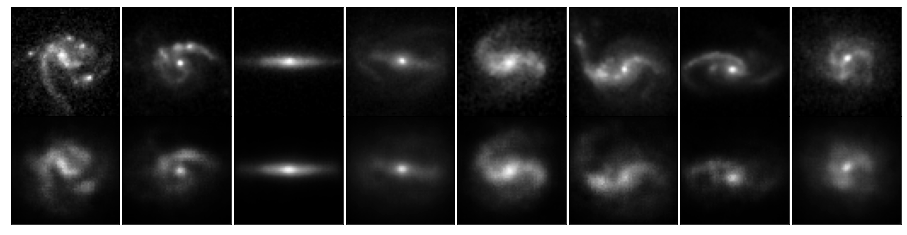

Maximal brightness 1.0


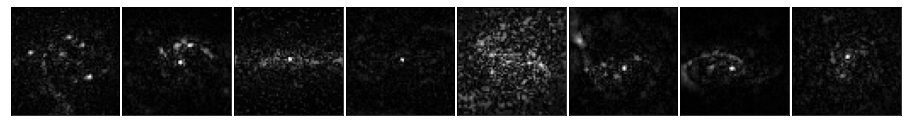

In [ ]:
Analysis.present_reconstruction(models['vae'],imgs,reconstruction_loss_function=reconstruction_loss_function,labels=labels_to_compare,grads=True)

8
Maximal brightness 1.0


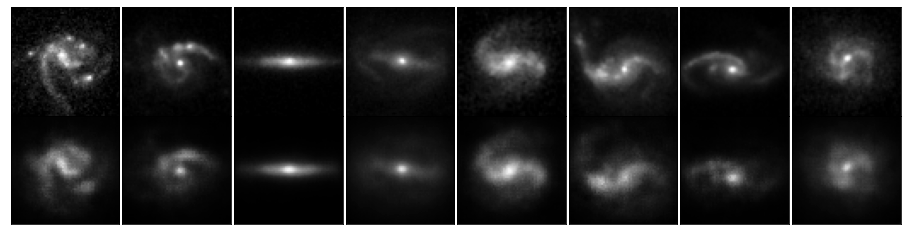

Maximal brightness 0.46618482169834863


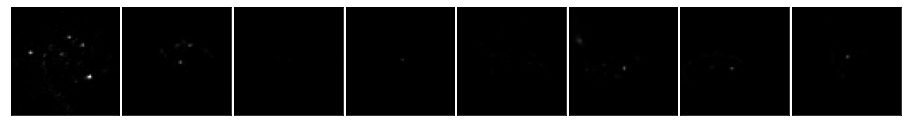

In [ ]:
Analysis.present_reconstruction(models['vae'],imgs,reconstruction_loss_function=reconstruction_loss_function,labels=labels_to_compare,resid=True)

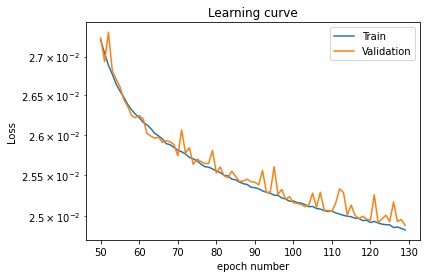

In [ ]:
Analysis.learning_curve(Checkpoints_Folder+'logs.txt',50,100000)

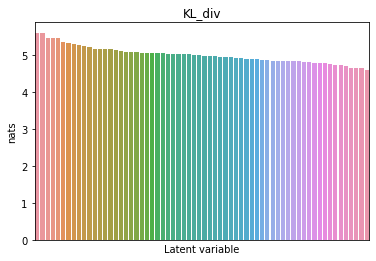

In [ ]:
DKL=Analysis.DKL_per_variable(z_means,z_log_vars)

0 130 130


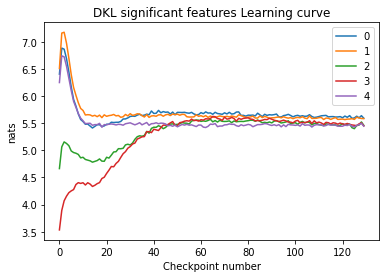

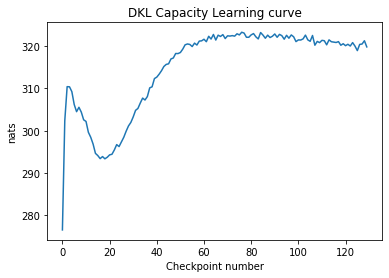

In [ ]:
Analysis.DKL_learning_curve(Checkpoints_Folder+'DKL.txt',0,100000)

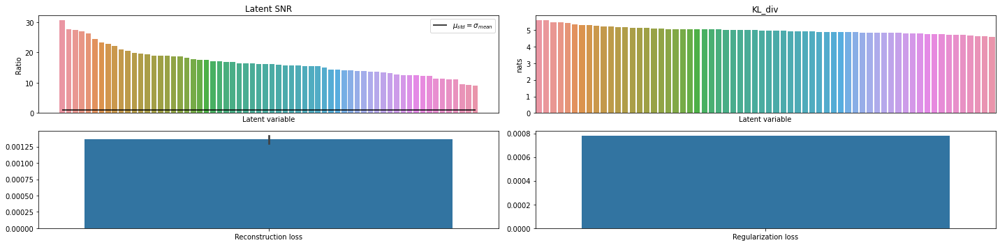

In [ ]:
Analysis.Show_latent_distr(models,x_test_labeled,reconstruction_loss_function,regularization_loss_function)

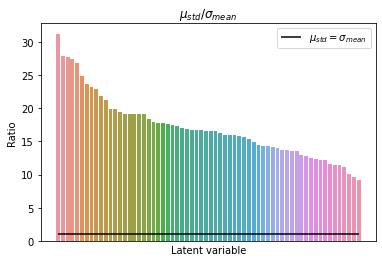

In [ ]:
Analysis.latent_relation_of_variances(ratio,sorted=True)

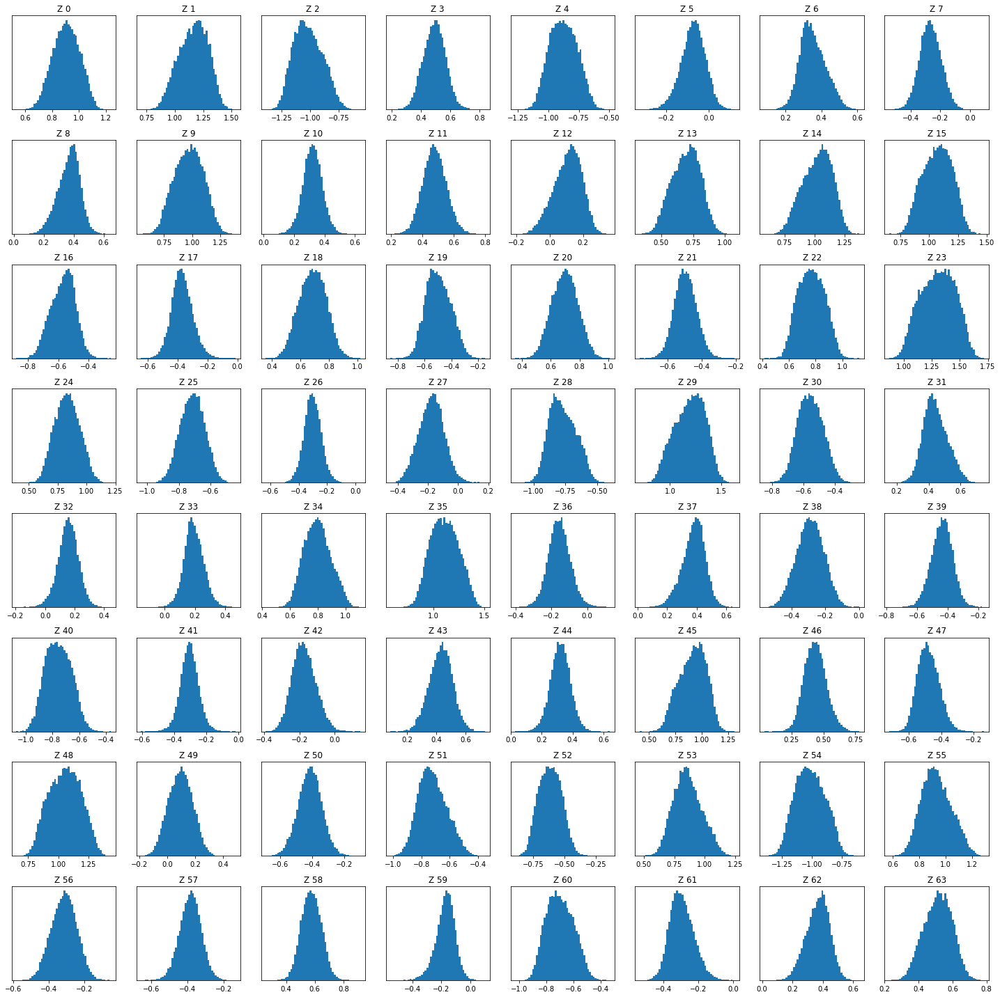

In [ ]:
Analysis.latent_distribution(z_means)

Maximal brightness 0.91163844


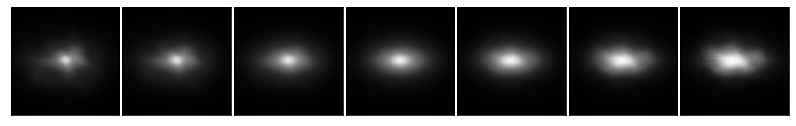

Maximal brightness 0.9292928


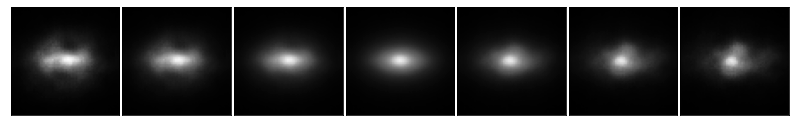

Maximal brightness 0.9219486


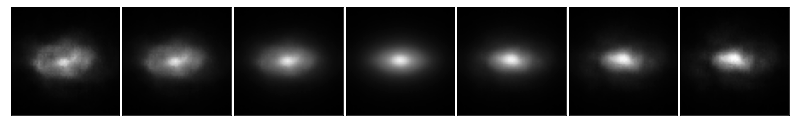

Maximal brightness 0.9083423


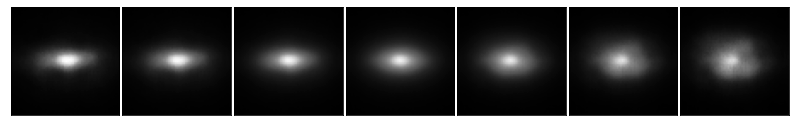

In [ ]:
Analysis.galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=4,dimensions='2d',sort_array=ratio)

Explained variance ratio [0.61250347 0.05627791 0.0282211  0.01566382]
Maximal brightness 0.81605


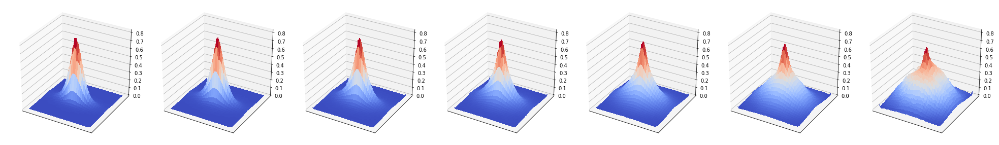

Maximal brightness 0.81711406


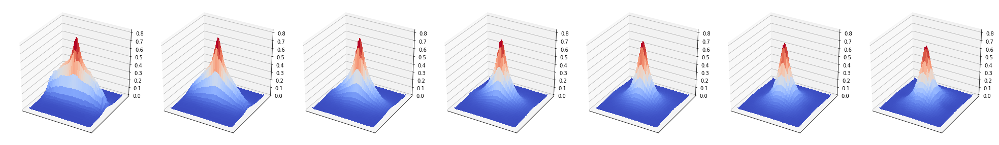

Maximal brightness 0.82953674


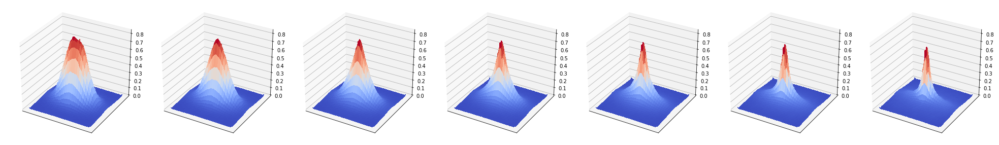

Maximal brightness 1.0310224


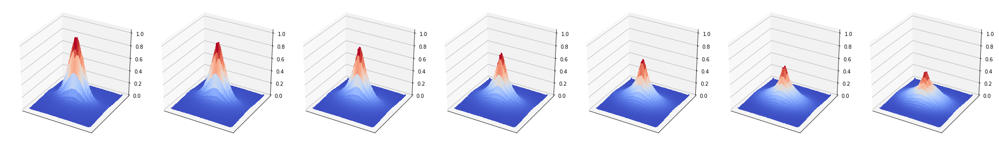

In [ ]:
Analysis.galaxy_properties_from_PCA(models,z_means,n_components=4,dimensions='3d')

Maximal brightness 1.2949389


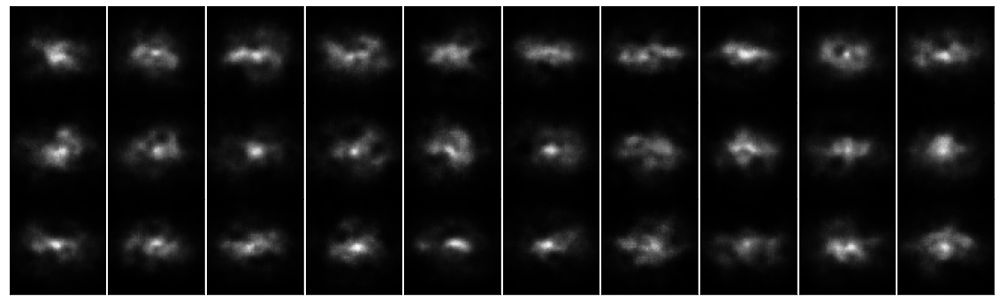

In [ ]:
Analysis.sample_random_images(models,z_means)

Maximal brightness 1.2223893


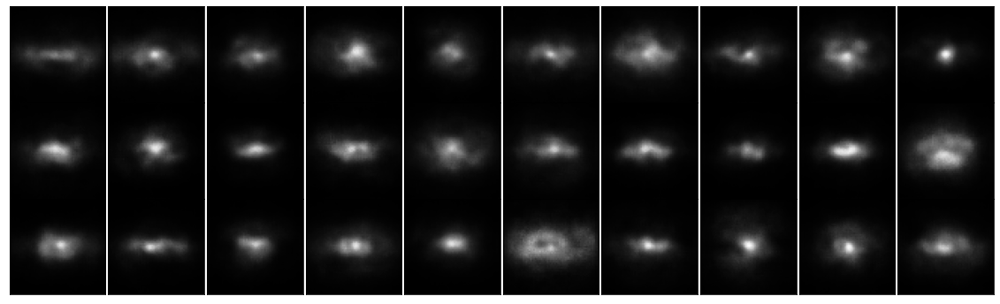

In [ ]:
Analysis.sample_random_images_PCA(models,z_means)

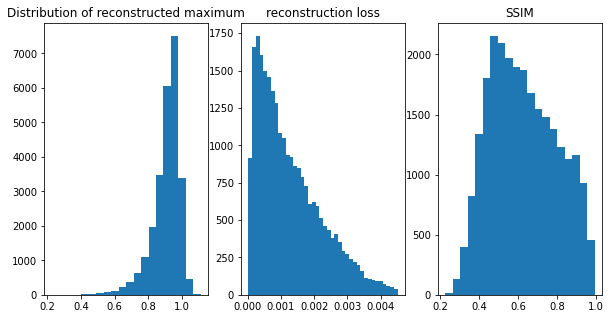

Max values RAE 0.094 ± 0.081, median 0.072
reconstruction loss values 0.001274 ± 0.000960, median 0.001031
SSIM values 0.628 ± 0.170, median 0.612


In [ ]:
Analysis.numerical_reconstruction_quality(galaxies_labeled,decoded,reconstruction_loss_function)